In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import networkx as nx
import regex as reg
from mpl_toolkits.basemap import Basemap
from networkx.algorithms.community import greedy_modularity_communities
from matplotlib.colors import ListedColormap
%matplotlib inline

Loading the data about universities:

In [2]:
universities = pd.read_pickle('data/Universities.pkl')
universities.head()

,file,name,domain,email,author_order,country,Lat,Lon
0,import2018_371,University of Colorado at Boulder,colorado.edu,rebecca.swanson@colorado.edu,0,United States,40.006667,-105.267222
1,import2018_371,University of Colorado at Boulder,colorado.edu,leighanna.hinojosa@colorado.edu,1,United States,40.006667,-105.267222
2,import2018_371,University of Colorado at Boulder,colorado.edu,joseph.polman@colorado.edu,2,United States,40.006667,-105.267222
3,import2018_417,Indiana University at Bloomington,indiana.edu,huang220@indiana.edu,0,United States,39.167222,-86.521389
4,import2018_417,Indiana University at Bloomington,gmail.com,agomoll90@gmail.com,1,United States,39.167222,-86.521389


In [3]:
universities.rename(columns={'email': 'mail'}, inplace=True)

In [4]:
universities['merge_index'] = universities.apply(lambda x: x['file']+str(x['author_order']), axis=1)

metadata = pd.read_csv('data/Parsed_metadata.csv', index_col=0, parse_dates=['accessioned', 'available', 'issued'])
metadata.issued = metadata.issued.map(lambda x: x.year)
metadata['merge_index'] = metadata.apply(lambda x: x['file']+str(x['author_order']), axis=1)
associations = pd.merge(universities, metadata, on='merge_index')

In [5]:
associations.rename(columns={'file_x': 'file'}, inplace=True)

# Looking at co authorship, taking into consideration country and inst.

We use the associations frame again to build a co-authorship graph based on people with attributes country and institution

In [6]:
associations.columns
#we can drop one of the file columns
(associations.file != associations.file_y).sum()

0

In [7]:
del associations['file_y']

In [8]:
associations = associations[associations.country.notna()]

In [9]:
self_merge = pd.merge(associations, associations, on='file')
self_merge = self_merge[self_merge.long_name_x != self_merge.long_name_y]

#edges = self_merge[['long_name_x', 'long_name_y', 'issued_x']].copy()

nodes = associations[~associations.long_name.duplicated()].reset_index(drop=True).reset_index()
name_index = nodes.long_name.to_dict()
name_index = {v: k for k, v in name_index.items()}

In [10]:
self_merge['source'] = self_merge.long_name_x.map(name_index)
self_merge['target'] = self_merge.long_name_y.map(name_index)

In [11]:
def get_adjacency(nodes, edges):
    n_nodes = len(nodes)
    adjacency = np.zeros((n_nodes, n_nodes), dtype=int)

    for idx, row in edges.iterrows():
        i, j = int(row.source), int(row.target)
        adjacency[i, j] += 1
        adjacency[j, i] = adjacency[i, j]


    return adjacency

In [12]:
adjacency = get_adjacency(nodes, self_merge)
graph = nx.from_numpy_array(adjacency)

Adding attributes to the graph:

In [13]:
edge_dict = {}
for i, row in self_merge.iterrows():
    edge_dict[(row['source'], row['target'])] =  row['issued_x']

In [14]:
nx.set_edge_attributes(graph, edge_dict, name='year')
nx.set_node_attributes(graph, nodes.country.to_dict(), name='country')
nx.set_node_attributes(graph, nodes.name.to_dict(), name='uni')
mapping = nodes.long_name.to_dict()
H=nx.relabel_nodes(graph,mapping)

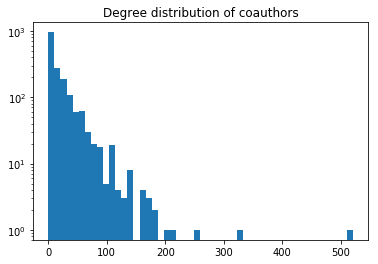

In [15]:
plt.title('Degree distribution of coauthors')
plt.hist(adjacency.sum(axis=1), bins=50, log=True)
plt.show()

This is a simple drawing of our network: we see that there is a large core communit, and many many smaller comminitues of co authors. We will look more into the main community

/anaconda3/envs/Biblio/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:611: MatplotlibDeprecationWarning: isinstance(..., numbers.Number)
  if cb.is_numlike(alpha):


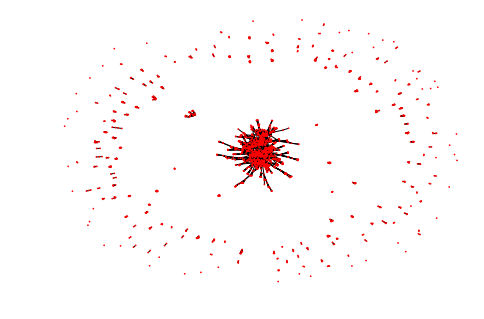

In [16]:
nx.draw(graph, pos=nx.spring_layout(graph), node_size=[0.5,0.5])

In [17]:
embedding = nodes.apply(lambda x: [x.Lon, x.Lat], axis=1)

In [29]:
weight = nx.get_edge_attributes(graph, 'weight')

/anaconda3/envs/Biblio/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:611: MatplotlibDeprecationWarning: isinstance(..., numbers.Number)
  if cb.is_numlike(alpha):


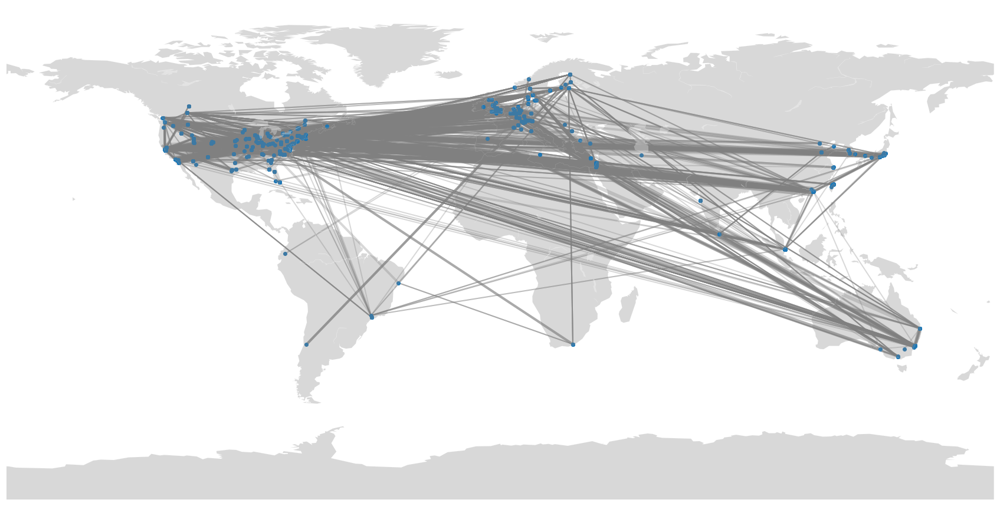

In [52]:
plt.figure(figsize=(30, 20))
m=Basemap()
m.drawmapboundary(linewidth=0)
m.fillcontinents(color='grey', alpha=0.3)
m.drawcoastlines(linewidth=0.1, color="white")
 
# prepare a color for each point depending on the continent.
data = nodes.copy()
 
# Add a point per position
#
nx.draw_networkx_edges(graph, pos = embedding, edge_color='grey', width=list(weight.values()), alpha=0.3)
m.scatter(data['Lon'], data['Lat'])

We focus in on the different components:

In [19]:
#get components
largest_cc = max(nx.connected_components(graph), key=len)

The total number of components is:

In [20]:
nx.number_connected_components(graph)

206

In [21]:
print(f'the largest component contains : {len(largest_cc)} people')

the largest component contains : 1136 people


Use centrality to highlight nodes that function as "bridges" between people

In [22]:
centrality = nx.betweenness_centrality(graph.subgraph(largest_cc))

In [23]:
centrality_2 = nx.current_flow_betweenness_centrality(graph.subgraph(largest_cc))

In [24]:
np.quantile(np.array(list(centrality.values())), 0.9)

0.009402073929776529

In [25]:
lables = nodes['long_name'].to_dict()

lables = { key: lables[key] for (key, value) in centrality.items() if value > 0.03}
lables

{2: 'Polman, Joseph L',
 21: 'Fischer, Frank',
 37: 'Moher, Tom',
 38: 'Slotta, James D.',
 47: 'Peppler, Kylie A',
 63: 'Puntambekar, Sadhana',
 72: 'Shapiro, R. Benjamin',
 97: 'Zhang, Jianwei',
 98: 'Chen, Mei-Hwa',
 120: 'Danish, Joshua A.',
 132: 'Clarke, Sherice',
 146: 'Kali, Yael',
 154: 'Bielaczyc, Katerine',
 155: 'Kapur, Manu',
 179: 'Rummel, Nikol',
 240: 'Jona, Kemi',
 255: 'Tan, Michael',
 256: 'Sandoval, William A.',
 282: 'van Aalst, Jan',
 318: 'Rosé, Carolyn',
 319: 'kafai, yasmin',
 320: 'Tissenbaum, Mike',
 322: 'Telhan, Orkan',
 347: 'Nathan, Mitchell',
 417: 'Dillenbourg, Pierre',
 460: 'Chan, Carol',
 519: 'Santo, Rafi',
 547: 'Hall, Rogers',
 605: 'Bang, Megan',
 891: 'Kidron, Adi',
 1162: 'Lund, Kristine',
 1163: 'Radinsky, Josh',
 1261: 'Barma, Sylvie',
 1377: 'Laferrière, Thérèse',
 1454: 'Kirschner, Paul'}

In [26]:
node_size = np.array(list(centrality.values()))*5000

/anaconda3/envs/Biblio/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:611: MatplotlibDeprecationWarning: isinstance(..., numbers.Number)
  if cb.is_numlike(alpha):


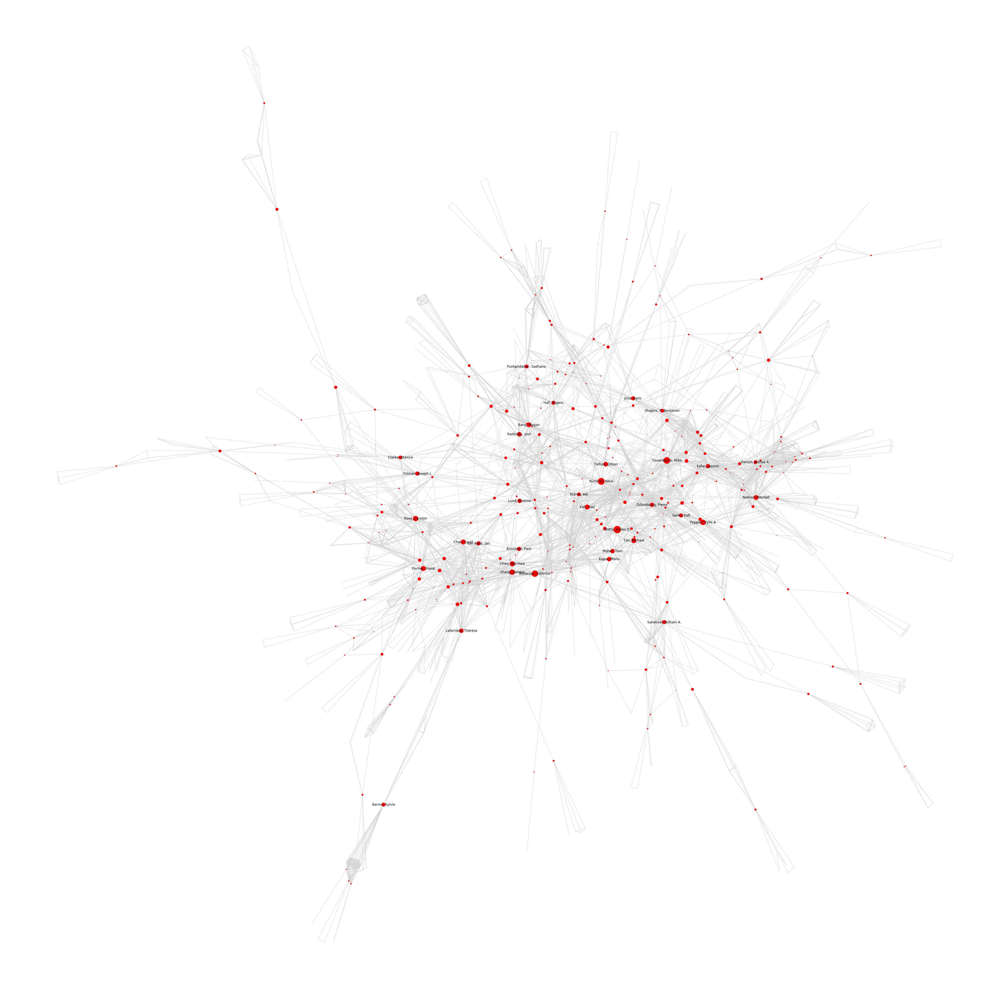

In [27]:
plt.figure(figsize=(50, 50))
nx.draw(graph.subgraph(largest_cc), node_size=node_size, edge_color='lightgray', labels=lables)

**Same graph for people who collaborated at least on 4 papers:**

e.g. we look at frequent collaborators (also forming a main component)

In [53]:
G = nx.Graph(((source, target, attr) for source, target, attr in graph.edges(data=True) if attr['weight'] > 3))
largest_cc_strong = max(nx.connected_components(G), key=len)
len(largest_cc_strong)

418

In [54]:
node_size = np.array(list(nx.betweenness_centrality(G.subgraph(largest_cc_strong)).values()))

In [55]:
lables = nodes.iloc[list(largest_cc_strong)]['long_name'].to_dict()

/anaconda3/envs/Biblio/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:611: MatplotlibDeprecationWarning: isinstance(..., numbers.Number)
  if cb.is_numlike(alpha):


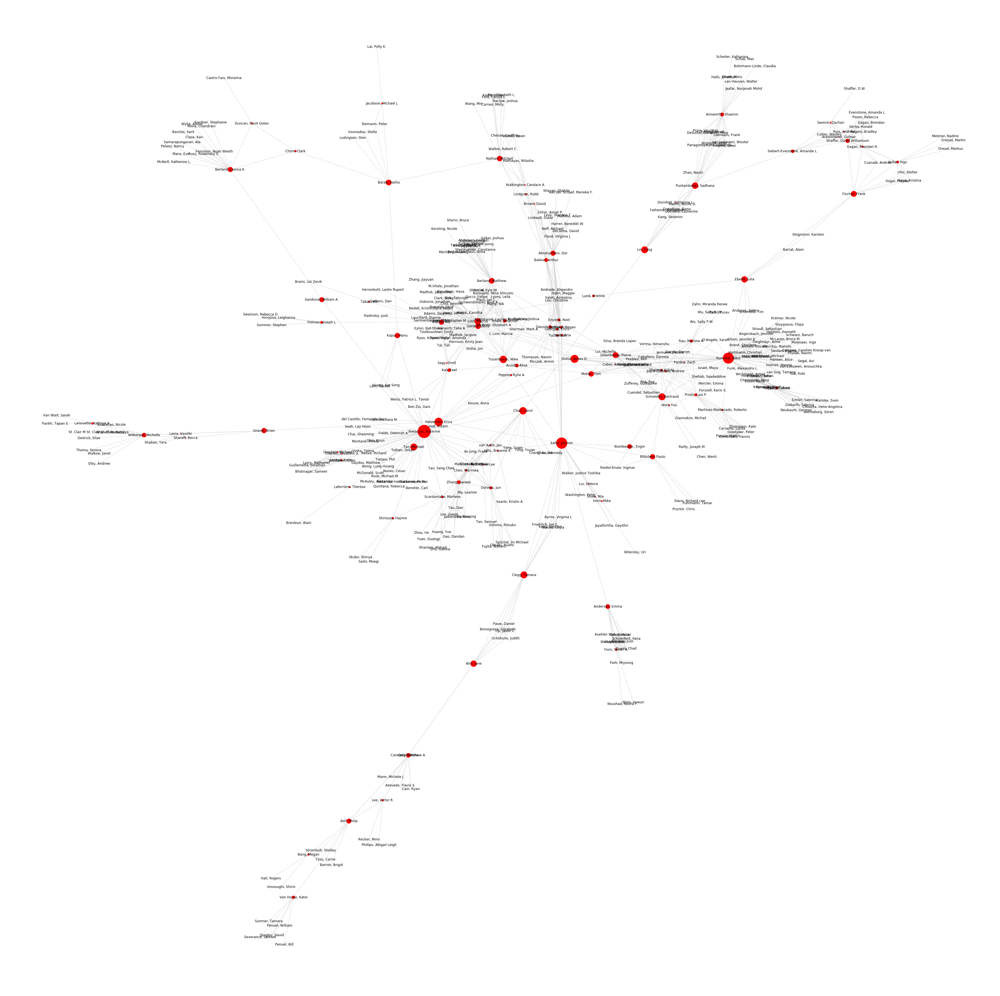

In [56]:
plt.figure(figsize=(50, 50))
nx.draw_spring(G.subgraph(largest_cc_strong), node_size=node_size*5000, labels=lables, edge_color='lightgray')

Drawing it in a geographical embedding:

In [57]:
def draw_map_plot(data, color='teal'):
    m=Basemap()
    m.drawmapboundary(linewidth=0)
    m.fillcontinents(color='grey', alpha=0.3)
    m.drawcoastlines(linewidth=0.1, color="white")
    m.scatter(data['Lon'], data['Lat'], s= 50, c= color, alpha=1)

In [58]:
embedding = nodes.iloc[list(largest_cc)].apply(lambda x: [x.Lon, x.Lat], axis=1)

/anaconda3/envs/Biblio/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:611: MatplotlibDeprecationWarning: isinstance(..., numbers.Number)
  if cb.is_numlike(alpha):


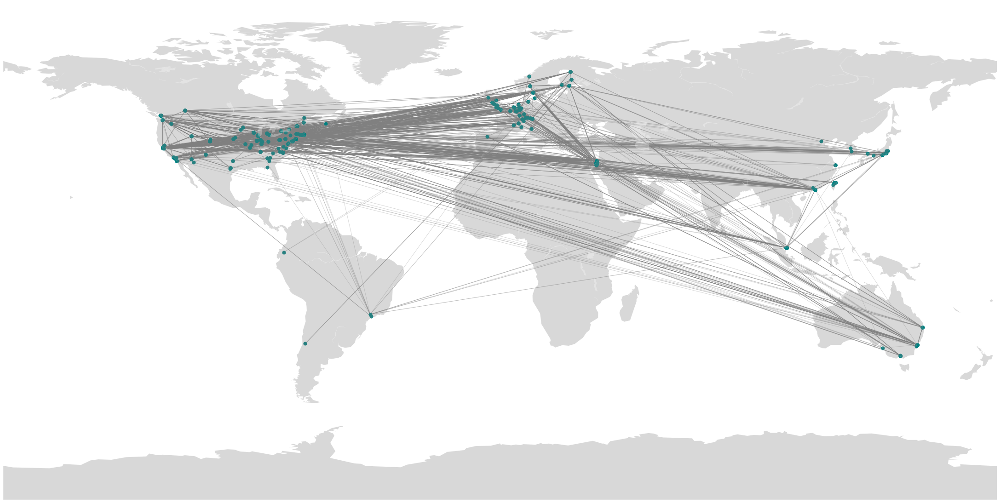

In [59]:
plt.figure(figsize=(30, 20))

 
# prepare a color for each point depending on the continent.
data = nodes.iloc[list(largest_cc)].copy()

#add edges
nx.draw(graph.subgraph(largest_cc), node_size=[0,0], pos = embedding, edge_color='grey', alpha=0.3)
draw_map_plot(data)

/anaconda3/envs/Biblio/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:611: MatplotlibDeprecationWarning: isinstance(..., numbers.Number)
  if cb.is_numlike(alpha):


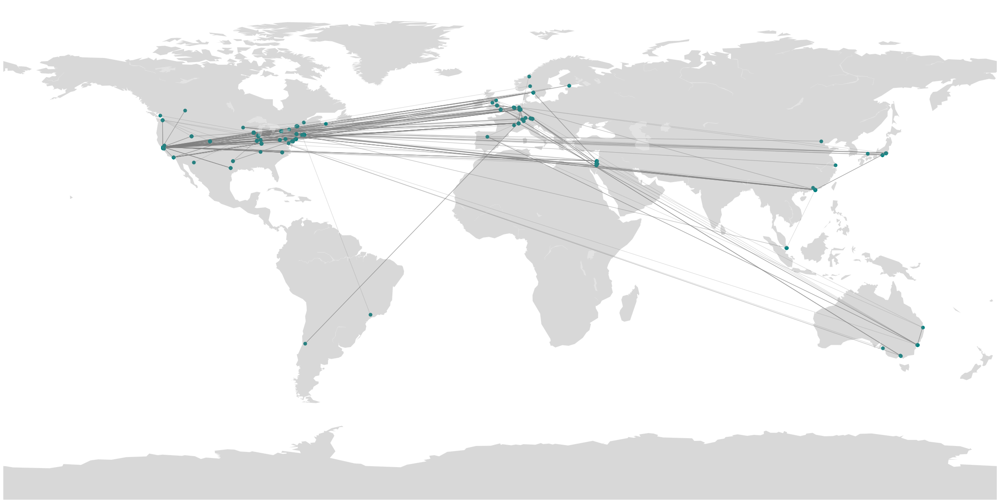

In [60]:
plt.figure(figsize=(30, 20))

 
# prepare a color for each point depending on the continent.
data = nodes.iloc[list(largest_cc_strong)].copy()

#add edges
nx.draw(G.subgraph(largest_cc_strong), node_size=[0,0], pos = embedding, edge_color='grey', alpha=0.3)
draw_map_plot(data)

### Who colaborates the most:

We can easely find the people who worked with the most other people:
(counting repeat collaboration)

In [61]:
nodes['collabs_weighted'] = adjacency.sum(axis=1)
nodes.sort_values(by='collabs_weighted', ascending=False)[['long_name', 'country', 'name', 'collabs_weighted']].head(10)

,long_name,country,name,collabs_weighted
179,"Rummel, Nikol",Germany,Ruhr-University Bochum,520
235,"Linn, Marcia",United States,"University of California, Berkeley",332
63,"Puntambekar, Sadhana",United States,University of Wisconsin - Madison,252
368,"Gerard, Libby",United States,"University of California, Berkeley",208
154,"Bielaczyc, Katerine",United States,"Hiatt Center for Urban Education, Clark Univer...",200
233,"Vitale, Jonathan",United States,"University of California, Berkeley",184
38,"Slotta, James D.",Canada,University of Toronto,182
388,"Abrahamson, Dor",United States,"University of California, Berkeley",172
97,"Zhang, Jianwei",United States,State University of New York at Albany,172
120,"Danish, Joshua A.",United States,Indiana University at Bloomington,170


Same as above but counting person only once:

In [62]:
nodes['collabs_unweighted'] = np.where(adjacency > 0, 1, 0).sum(axis=1)
nodes.sort_values(by='collabs_unweighted', ascending=False)[['long_name', 'country', 'name', 'collabs_unweighted']].head(10)

,long_name,country,name,collabs_unweighted
146,"Kali, Yael",Sweden,Göteborg University,63
38,"Slotta, James D.",Canada,University of Toronto,61
179,"Rummel, Nikol",Germany,Ruhr-University Bochum,61
97,"Zhang, Jianwei",United States,State University of New York at Albany,59
98,"Chen, Mei-Hwa",United States,State University of New York at Albany,54
39,"Acosta, Alisa",Canada,University of Toronto,54
318,"Rosé, Carolyn",United States,Carnegie Mellon University,53
605,"Bang, Megan",United States,University of Washington,51
319,"kafai, yasmin",United States,University of Pennsylvania,50
460,"Chan, Carol",Hong Kong,University of Hong Kong,49


### Zooming into largest community: - country & institution

In [63]:
main_component = nodes[nodes.index.isin(largest_cc)]

Comparing the country representation in main component to the one overall.

Text(0, 0.5, 'Counts')

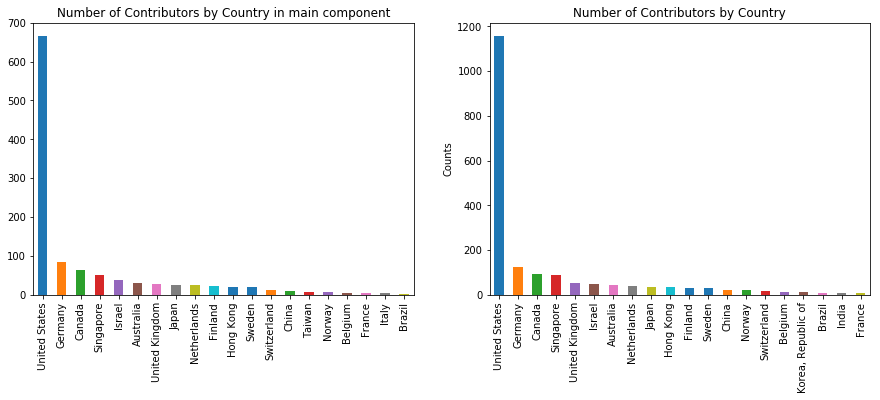

In [64]:
plt.figure(figsize=(15, 5))
plt.subplot(121)
plt.title('Number of Contributors by Country in main component')
main_component.country.value_counts().head(20).plot(kind='bar')
plt.subplot(122)
universities[(~universities.mail.duplicated())].country.value_counts().head(20).plot(kind = 'bar')
plt.title('Number of Contributors by Country') # as determinded by university affiliation
plt.ylabel('Counts')

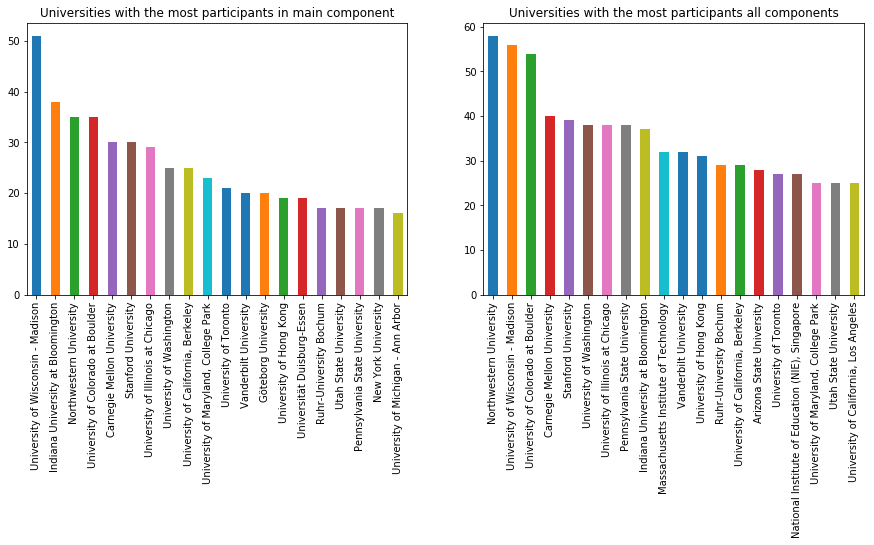

In [65]:
plt.figure(figsize=(15, 5))
plt.subplot(121)
#plt.ylim([0, 60])
plt.title('Universities with the most participants in main component')
main_component.name.value_counts().head(20).plot(kind='bar')
plt.subplot(122)
#plt.ylim([0, 60])
plt.title('Universities with the most participants all components')
universities[(universities.name != 'gmail') & (~universities.mail.duplicated())].name.value_counts().head(20).plot(kind='bar')
plt.show()

## Finding communities in the community: Modularity and Other measures

Constructing the graph with the largest component:

In [66]:
main_component = graph.subgraph(largest_cc)
mapping = nodes.long_name.to_dict()
main_component=nx.relabel_nodes(main_component,mapping)

Here we use modularity to detect communities, which will find subgraph that are unliquely to have developed "randomly".

From wikipedia:

>It was designed to measure the strength of division of a network into modules (also called groups, clusters or communities). Networks with high modularity have dense connections between the nodes within modules but sparse connections between nodes in different modules. Modularity is often used in optimization methods for detecting community structure in networks

In [67]:
c = list(greedy_modularity_communities(main_component))

We find 18 communities in total:

In [68]:
len(c)

19

In [69]:
#smallest community:
min(c, key=len)

frozenset({'Quignard, Matthieu', 'Tchounikine, Pierre', 'Wang, Patrick'})

## Intermezzo: removing duplicate names!

We could use this to elliminate duplicates, merge some people:

The difficulty is to not have any false positives. False negatives are fine, We thus decide to look at similar names **within** the communities we found. Additionaly we check that the same last name is present and exclude some last names (chinese ones) as they are prone to lead to false positives.

In [70]:
#example of duplicates showing up!
metadata[metadata.long_name.isin(['Cuendet, Sebastien', 'Cuendet, Sébastien'])]

,file,subject,iso,uri,type,publisher,title,issued,accessioned,citation,available,abstract,long_name,author_order,shortend_names,identifier,merge_index
1656,import2016full_68,NaN,en,info:doi/10.22318/icls2016.68,Book chapter,Singapore: International Society of the Learni...,Detecting Collaborative Dynamics Using Mobile ...,2016,2017-03-21 12:05:42,"Schneider, B., Sharma, K., Cuendet, S., Zuffer...",2017-03-21 12:05:42,Prior work has successfully described how low ...,"Cuendet, Sebastien",2,Sharma K.,"Schneider, B., Sharma, K., Cuendet, S., Zuffer...",import2016full_682
1742,import2015full_182,"['tangible user interface', 'eye-tracking', 'j...",en,https://doi.dx.org/10.22318/cscl2015.182,Book chapter,International Society of the Learning Science...,3D Tangibles Facilitate Joint Visual Attention...,2015,2017-06-19 14:15:51,"Schneider, B., Sharma, K., Cuendet, S., Zuffer...",2017-06-19 14:15:51,We report results from a dual eye-tracking stu...,"Cuendet, Sébastien",2,Sharma K.,"Schneider, B., Sharma, K., Cuendet, S., Zuffer...",import2015full_1822
1862,import2015short_182,"['tangible user interface', 'eye-tracking', 'j...",en,https://doi.dx.org/10.22318/cscl2015.182,Book chapter,International Society of the Learning Science...,3D Tangibles Facilitate Joint Visual Attention...,2015,2017-06-19 14:15:51,"Schneider, B., Sharma, K., Cuendet, S., Zuffer...",2017-06-19 14:15:51,We report results from a dual eye-tracking stu...,"Cuendet, Sébastien",2,Sharma K.,"Schneider, B., Sharma, K., Cuendet, S., Zuffer...",import2015short_1822


Number of members before uniformisation:

In [71]:
import difflib
import unicodedata


def find_name_matching(c, threshold = 0.8, last_names_to_ignore = ['zhang', 'chen', 'liu', 'wang']):
    """finds different spellings of same name and gives mapping to create one person one name"""
    d = {}
    for community in c:
        members = list(community)
        for i, member in enumerate(members):
            for j, member_2 in enumerate(members):
                if i < j:
                    difference = difflib.SequenceMatcher(None, member, member_2).ratio()
                    if difference > threshold:
                        last_1 =reg.search('[\p{L}]*', unicodedata.normalize('NFC', member.lower())).group(0)
                        last_2 = reg.search('[\p{L}]*', unicodedata.normalize('NFC', member_2.lower())).group(0)
                        same_last_name = reg.search('[\p{L}]*', 
                                                    member.lower()).group(0) == reg.search(
                            '[\p{L}]*', member_2.lower()).group(0)
                        if same_last_name and last_1 not in last_names_to_ignore  and not member_2 in d.keys():
                            d[member_2] = member
    return d

d = find_name_matching(c)
len(d)

19

In [72]:
d

{'Azevedo, Flávio S.': 'Azevedo, Flavio S.',
 'Chan, Carol': 'Chan, Carol K.K.',
 'Cuendet, Sebastien': 'Cuendet, Sébastien',
 'Davis, Richard Lee': 'Davis, Richard',
 'Dornfeld, Catherine L.': 'Dornfeld, Catherine',
 'D’Angelo, Sarah': "D'Angelo, Sarah",
 'Eagan, Brendan': 'Eagan, Brendan R.',
 'Greenhow, Christine': 'Greenhow, Chrisine',
 'Keifert, Danielle Teodora': 'Keifert, Danielle',
 'Lee, Victor R.': 'Lee, Victor',
 'Levy, Sharona T.': 'Levy, Sharona T',
 'Madhok, Jacqueline': 'Madhok, Jacquie',
 'Penuel, Bill': 'Penuel, William',
 'Quintana, Rebecca M': 'Quintana, Rebecca',
 'Schunn, Chris': 'Schunn, Christian',
 'Severance, Sam': 'Severance, Samuel',
 'Shareff, Becca': 'Shareff, Rebecca',
 'Sheldon, Josh': 'Sheldon, Joshua',
 'Wu, Sally P. W.': 'Wu, Sally P.W.'}

Reason why we normalize the string:

In [73]:
ord(u'ä')

228

In [74]:
for c in u"ä":
    print(repr(c), ord(c))

'a' 97
'̈' 776


Now creating the graph as before with the better naming:

In [75]:
improved_associations = associations.copy()

improved_associations.loc[improved_associations.long_name.map(d).notna(), 'long_name'] = improved_associations.long_name.map(d)

self_merge = pd.merge(improved_associations, improved_associations, on='file')
self_merge = self_merge[self_merge.long_name_x != self_merge.long_name_y]
nodes = improved_associations[~improved_associations.long_name.duplicated()].reset_index(drop=True).reset_index()

name_index = nodes.long_name.to_dict()
name_index = {v: k for k, v in name_index.items()}

self_merge['source'] = self_merge.long_name_x.map(name_index)
self_merge['target'] = self_merge.long_name_y.map(name_index)

new_graph = nx.from_numpy_array(get_adjacency(nodes, self_merge))

components = nx.connected_components(new_graph)
largest_cc = max(nx.connected_components(new_graph), key=len)

main_component = new_graph.subgraph(largest_cc)
mapping = nodes.long_name.to_dict()

## clique detection:


Here we look at large groups of researchers that all have collaborated within eachother.
Only look at connections with weight at least 3 -> at least 3 collaborations, froming a clique of at least 7 people.

In [76]:
mc = nx.from_numpy_array(np.where(nx.to_numpy_array(main_component) >= 3, 1, 0))

main_component_ =nx.relabel_nodes(mc, mapping)
large_cliques = [l for l in list(nx.find_cliques(main_component_)) if len(l) > 6]

large_cliques[0]

['Haines, Cara',
 'Gouvea, Julia Svoboda',
 'Archibeque, Benjamin Archibeque',
 'Wagh, Aditi',
 'Munter, Charles',
 'Jaafar, Nurjanah Mohd',
 'Bruton, Rebecca']

We get a total of 12 groups:

In [77]:
len(large_cliques)

13

In [78]:
main_component_clique = nx.from_numpy_array(nx.to_numpy_array(main_component))

In [79]:
mc = nx.from_numpy_array(np.where(nx.to_numpy_array(main_component_clique) >=3, 1, 0))

In [80]:
large_cliques = [l for l in list(nx.find_cliques(mc)) if len(l) > 6]
color_cliques = {}
set_inclique = set()
for i, clique in enumerate(large_cliques):
    for member in clique:
        color_cliques[member] = i+1
        set_inclique.add(member)

In [81]:
for member in (set(main_component_clique.nodes)-set_inclique):
    color_cliques[member] = 0

Define colormap for better plotting:

   0  ||  1  ||  2  ||  3  ||  4  ||  5  ||  6  ||  7  ||  8  ||  9  ||  10  ||  11  ||  12


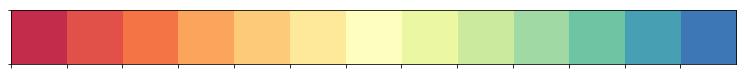

In [82]:
palette = sns.color_palette(palette='Spectral', n_colors=len(large_cliques))

sns.palplot(palette)
print('  ', '  ||  '.join([str(i) for i in list(range(len(large_cliques)))]))

In [83]:
colors = ['#C7C7C7'] + \
    sns.color_palette(palette='Spectral', n_colors=30).as_hex()

In [84]:
node_size = (np.array(list(nx.degree_centrality(main_component_clique).values())))
edge_color= np.array(list(nx.get_edge_attributes(main_component_clique, 'weight').values()))

/anaconda3/envs/Biblio/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:611: MatplotlibDeprecationWarning: isinstance(..., numbers.Number)
  if cb.is_numlike(alpha):


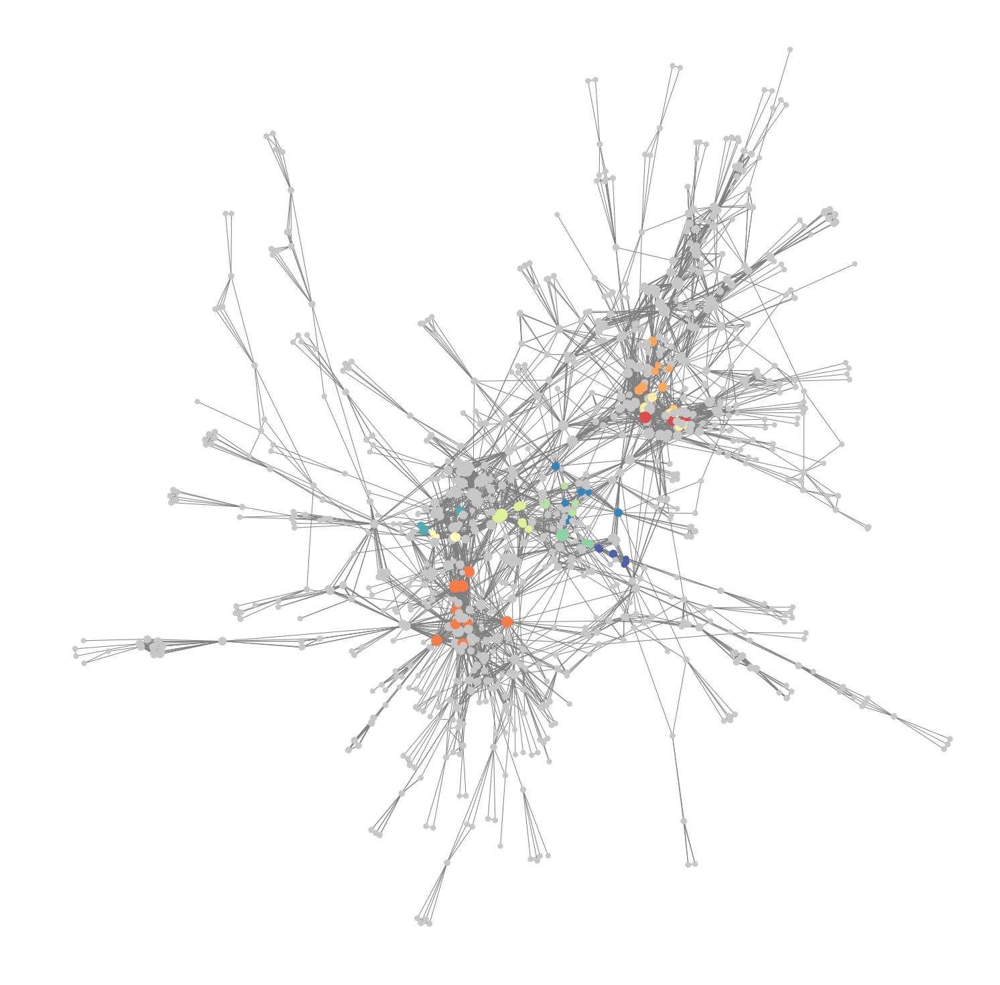

In [85]:
plt.figure(figsize=(20, 20))
nx.draw_spring(main_component_clique, node_color=pd.Series(color_cliques).sort_index().tolist(), 
              cmap=ListedColormap(colors),
              node_size=(node_size+node_size.mean())*5000,
               edge_color='grey',
               iterations=400)

In [86]:
color = {}
for i, clique in enumerate(large_cliques):
    for member in clique:
        color[member] = i+2

Here we look at these large cliques on a map. We see that while there are global comunities, many are bound to north america. Additonaly, such large collaboration networks do not exist on other continents! 

/anaconda3/envs/Biblio/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:611: MatplotlibDeprecationWarning: isinstance(..., numbers.Number)
  if cb.is_numlike(alpha):


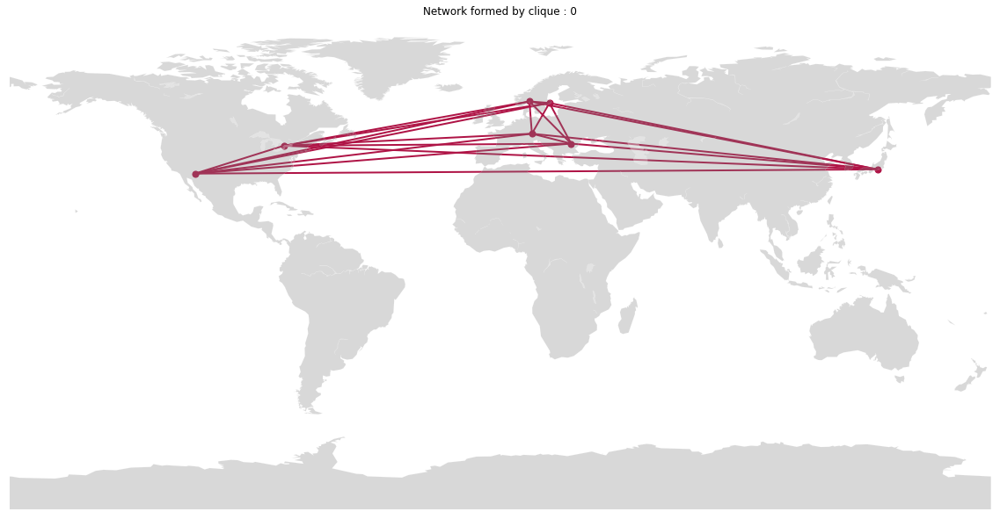

['Rodriguez, James', 'Berg, Yngvar', 'Oshima, Ritsuko', 'Wen, Yun', 'Collin, Jonas', 'Dascalu, Mihai', 'Tarnai, Christian', 'Håklev, Stian']


/anaconda3/envs/Biblio/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:611: MatplotlibDeprecationWarning: isinstance(..., numbers.Number)
  if cb.is_numlike(alpha):


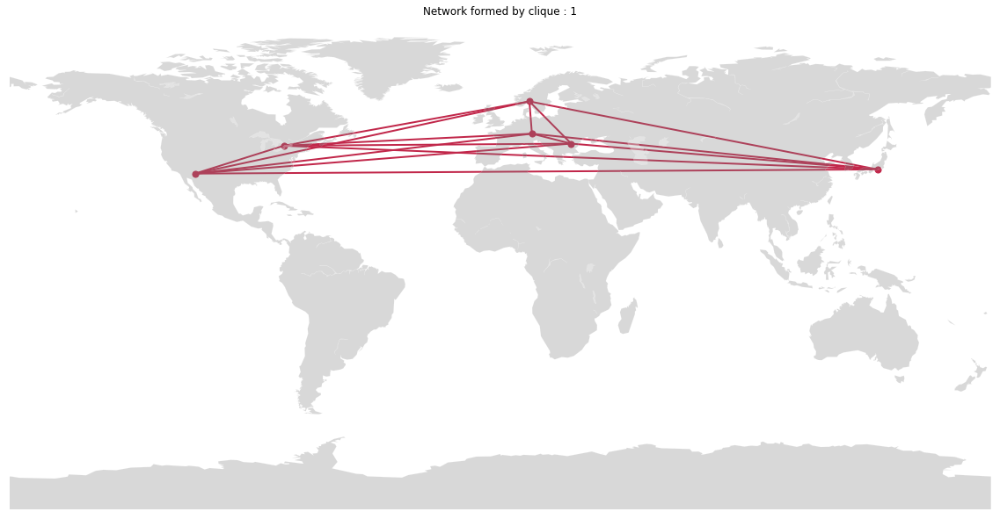

['Rodriguez, James', 'Berg, Yngvar', 'Oshima, Ritsuko', 'Bonsignore, Elizabeth', 'Dascalu, Mihai', 'Tarnai, Christian', 'Håklev, Stian']


/anaconda3/envs/Biblio/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:611: MatplotlibDeprecationWarning: isinstance(..., numbers.Number)
  if cb.is_numlike(alpha):


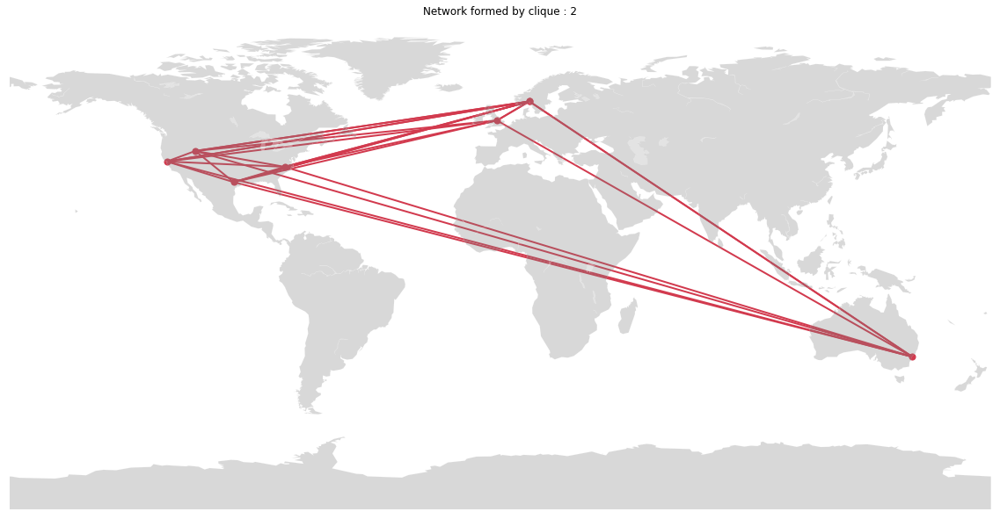

['Shapiro, R. Benjamin', 'Kluge, Anders', 'Wigmore, Peter', 'Dolonen, Jan Arild', 'Mann, Michele J.', 'Lobczowski, Nikki G.', 'Dorph, Rena', 'Feraud, Iván Silva', 'Braden, Sarah']


/anaconda3/envs/Biblio/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:611: MatplotlibDeprecationWarning: isinstance(..., numbers.Number)
  if cb.is_numlike(alpha):


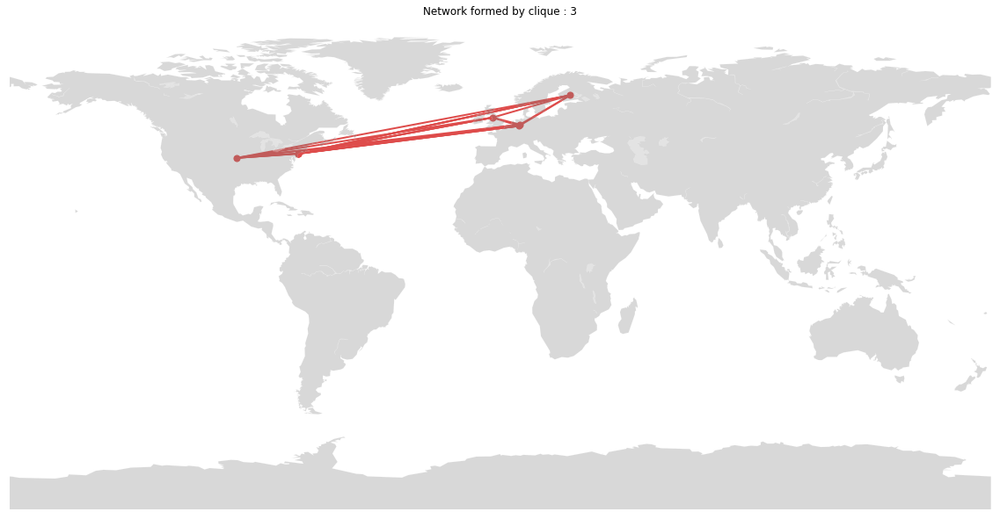

['Genz, Florian', 'Sayre, Eleanor C', 'kang, Seokbin', 'Flake, Sabrina', 'Slater, Stefan', 'Xing, Chenmu', 'Sarmiento, Juan Pablo', 'Öztok, Murat', 'Arvaja, Maarit']


/anaconda3/envs/Biblio/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:611: MatplotlibDeprecationWarning: isinstance(..., numbers.Number)
  if cb.is_numlike(alpha):


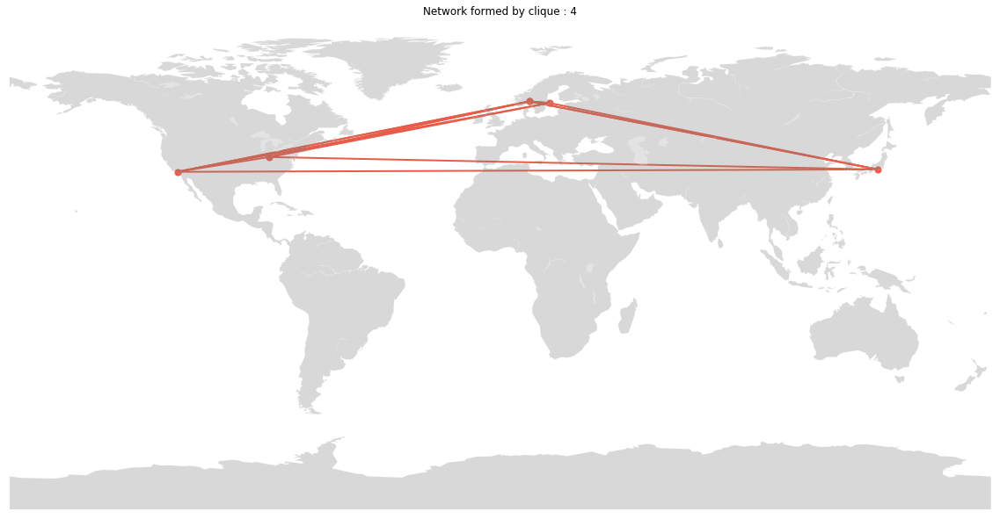

['Oshima, Ritsuko', 'Berg, Yngvar', 'Wen, Yun', 'Collin, Jonas', 'Pham, Josephine', 'Davis, Darrel', 'Damsa, Crina']


/anaconda3/envs/Biblio/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:611: MatplotlibDeprecationWarning: isinstance(..., numbers.Number)
  if cb.is_numlike(alpha):


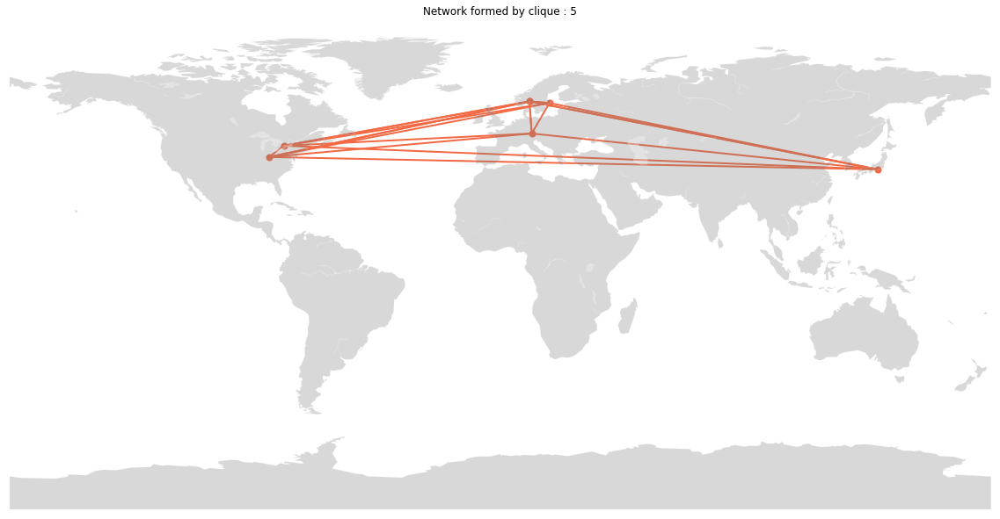

['Oshima, Ritsuko', 'Berg, Yngvar', 'Wen, Yun', 'Collin, Jonas', 'Håklev, Stian', 'Davis, Darrel', 'Nistor, Nicolae', 'Damsa, Crina']


/anaconda3/envs/Biblio/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:611: MatplotlibDeprecationWarning: isinstance(..., numbers.Number)
  if cb.is_numlike(alpha):


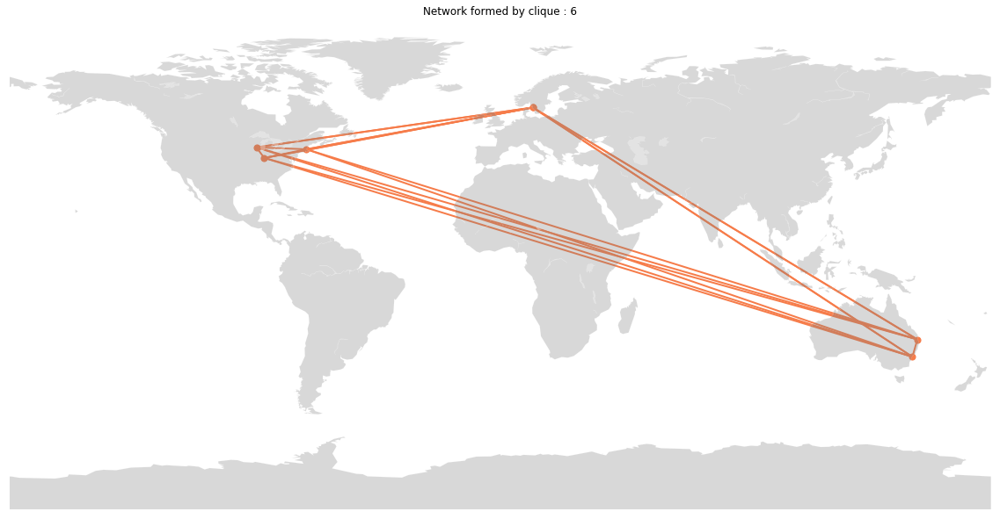

['Patel, Purav', 'Anderson, Emma', 'Danish, Joshua A.', 'Anderson, Theresa Dirndorfer', 'Hillman, Thomas', 'Renshaw, Peter', 'Solli, Anne']


/anaconda3/envs/Biblio/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:611: MatplotlibDeprecationWarning: isinstance(..., numbers.Number)
  if cb.is_numlike(alpha):


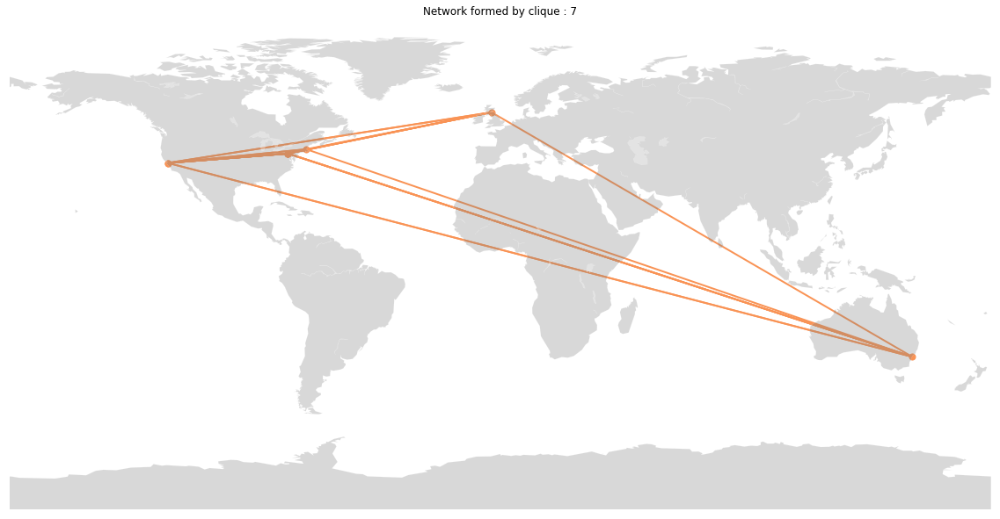

['McDonald, Scott', 'Curwood, Jen Scott', 'Dragomir, Mihaela', 'Walsh, Elizabeth M.', 'Cordero, Eugene', 'Blum-Smith, Sarah', 'Toprani, Dhvani', 'Borge, Marcela', 'Xia, Yu']


/anaconda3/envs/Biblio/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:611: MatplotlibDeprecationWarning: isinstance(..., numbers.Number)
  if cb.is_numlike(alpha):


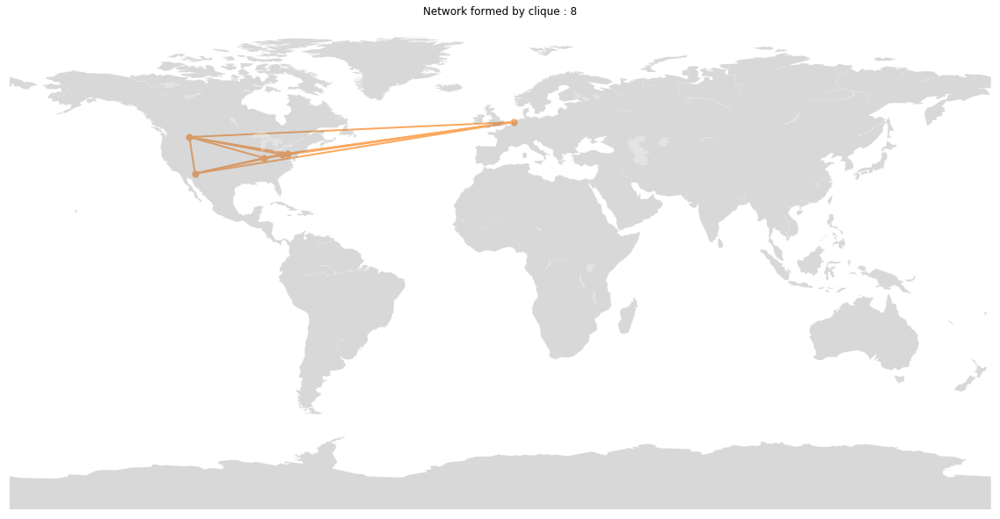

['McDonald, Scott', 'Adams, Joshua Adams', 'Plane, Angelisa C.', 'Sun, Jingjing', 'Cook, Lucas', 'Molenaar, Inge', 'Campen, Carolien Knoop-van']


/anaconda3/envs/Biblio/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:611: MatplotlibDeprecationWarning: isinstance(..., numbers.Number)
  if cb.is_numlike(alpha):


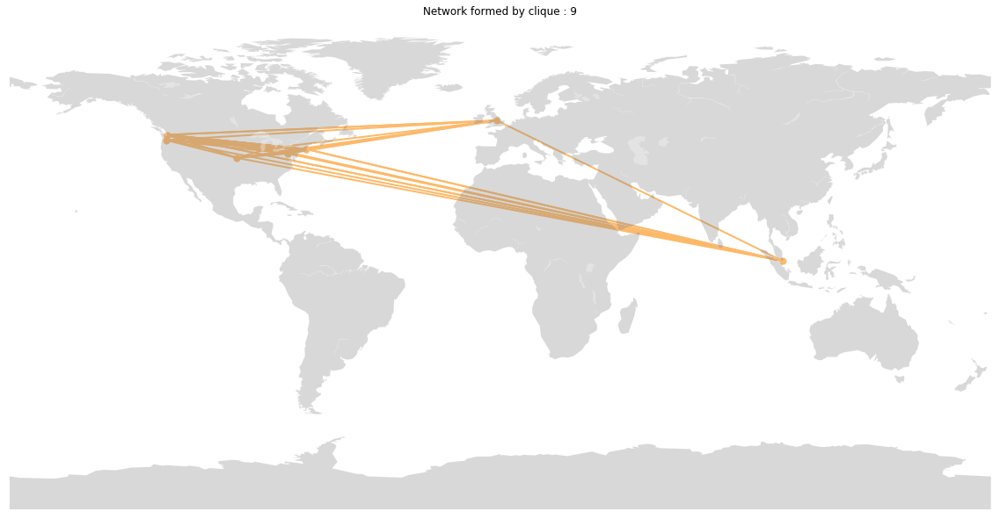

['McDonald, Scott', 'Ke, Li', 'Wagh, Aditi', 'Tierney, Gavin', 'Horstman, Theresa', 'Rodela, Katherine', 'Archibeque, Benjamin Archibeque', 'Chu, Shien', 'Jaafar, Nurjanah Mohd', 'Gouvea, Julia Svoboda']


/anaconda3/envs/Biblio/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:611: MatplotlibDeprecationWarning: isinstance(..., numbers.Number)
  if cb.is_numlike(alpha):


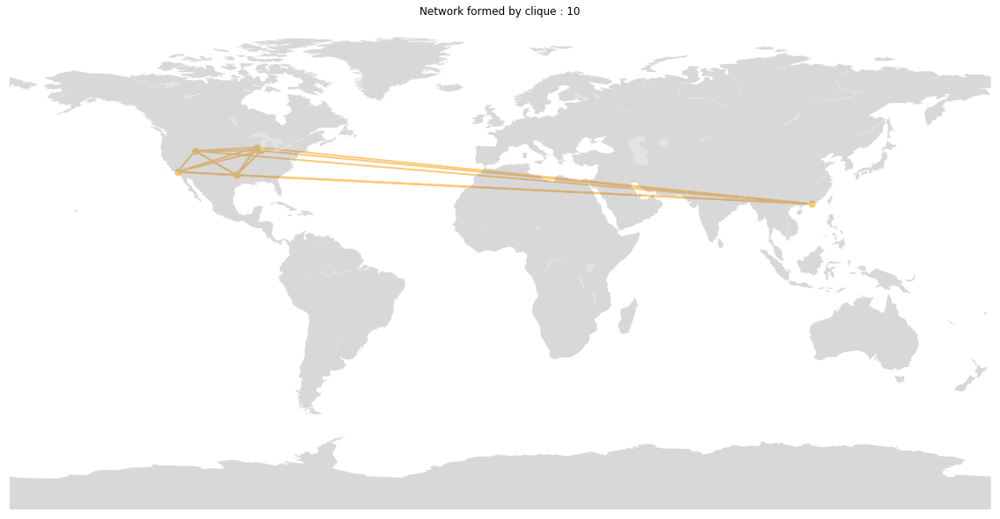

['Martin, Nicole D.', 'Warren, Beth', 'Philip, Thomas M.', 'Weintrop, David', 'Killen, Heather', 'Hall, Allison H', 'Liu, Kun', 'Chelule, Geoffrey', 'Woods, Dawn', 'Tofel-Grehl, Colby']


/anaconda3/envs/Biblio/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:611: MatplotlibDeprecationWarning: isinstance(..., numbers.Number)
  if cb.is_numlike(alpha):


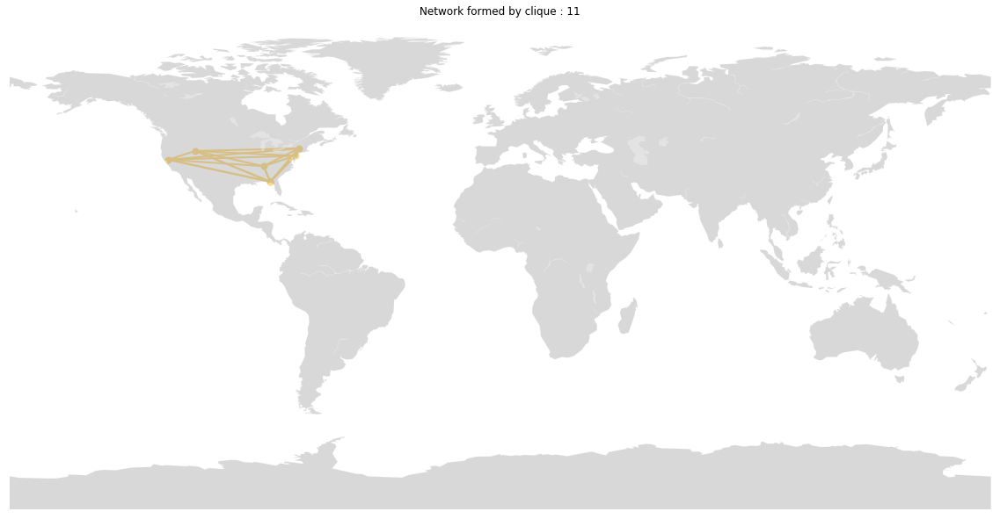

['Ching, Cynthia Carter', 'Chen, Mei-Hwa', 'Gresalfi, Melissa', 'Karumbaiah, Shamya', 'Rahimi, Seyedahmad', 'Baker, Ryan', 'Shute, Valerie']


/anaconda3/envs/Biblio/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:611: MatplotlibDeprecationWarning: isinstance(..., numbers.Number)
  if cb.is_numlike(alpha):


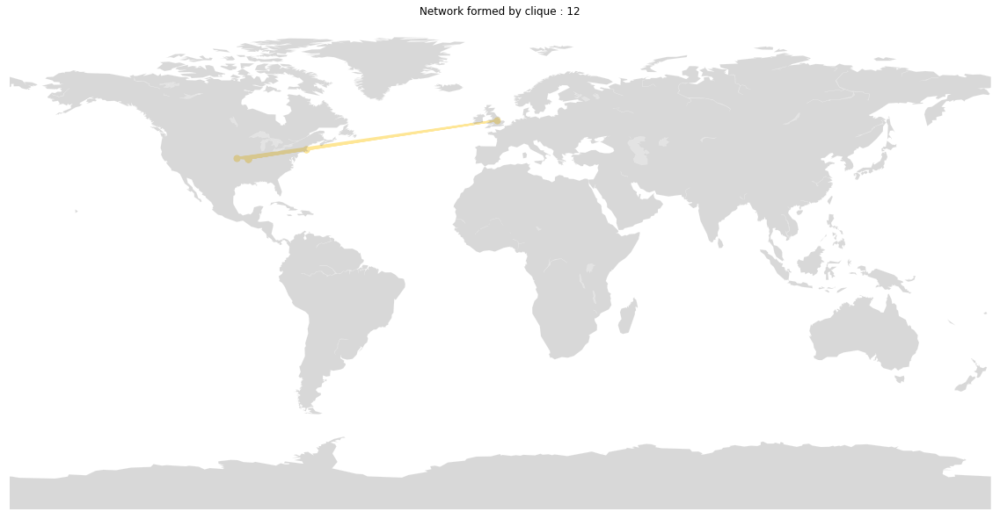

['Munter, Charles', 'Wagh, Aditi', 'Bruton, Rebecca', 'Archibeque, Benjamin Archibeque', 'Haines, Cara', 'Jaafar, Nurjanah Mohd', 'Gouvea, Julia Svoboda']


In [87]:
# prepare a color for each point depending on the continent.
 
# Add a point per position
for i, clique in enumerate(large_cliques):

    plt.figure(figsize=(20, 20))

    data = nodes.iloc[list(clique)].copy()
    draw_map_plot(data, colors[i+1])

    embedding = data.apply(lambda x: [x.Lon, x.Lat], axis=1)
    
    nx.draw_networkx_edges(main_component_clique.subgraph(clique),  pos = embedding, 
                           edge_color=colors[i+1], width = 2)
    plt.title('Network formed by clique : {}'.format(i))
    plt.show()
    print(data.long_name.tolist())
    


# Using modularity to identify communities:

In [88]:
mapping = nodes.long_name.to_dict()

c = list(greedy_modularity_communities(main_component))

We change the node size based on degree centrality, the larger the node the more collaborations the individual has:

In [89]:
def matching_by_criteria(c):
    member_label = {}
    for index, community in enumerate(c):
        members = list(community)
        for m in members:
            member_label[m] = index
    return member_label

In [90]:
member_label = matching_by_criteria(c)
nx.set_node_attributes(main_component, member_label, 'community')
node_colors = pd.Series(member_label).sort_index().tolist()
node_size = np.array(list(nx.degree_centrality(main_component).values()))

In [91]:
np.percentile(node_size, 98)

0.035842293906810034

   1  ||  2  ||  3  ||  4  ||  5  ||  6  ||  7  ||  8  ||  9  ||  10  ||  11  ||  12  ||  13  ||  14  ||  15  ||  16  ||  17


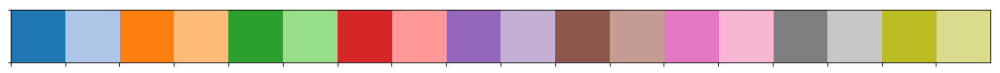

In [92]:
palette = sns.color_palette(palette='tab20', n_colors=len(c)+1)

sns.palplot(palette)
print('  ', '  ||  '.join([str(i) for i in list(range(1,len(c)+1))]))

/anaconda3/envs/Biblio/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:611: MatplotlibDeprecationWarning: isinstance(..., numbers.Number)
  if cb.is_numlike(alpha):


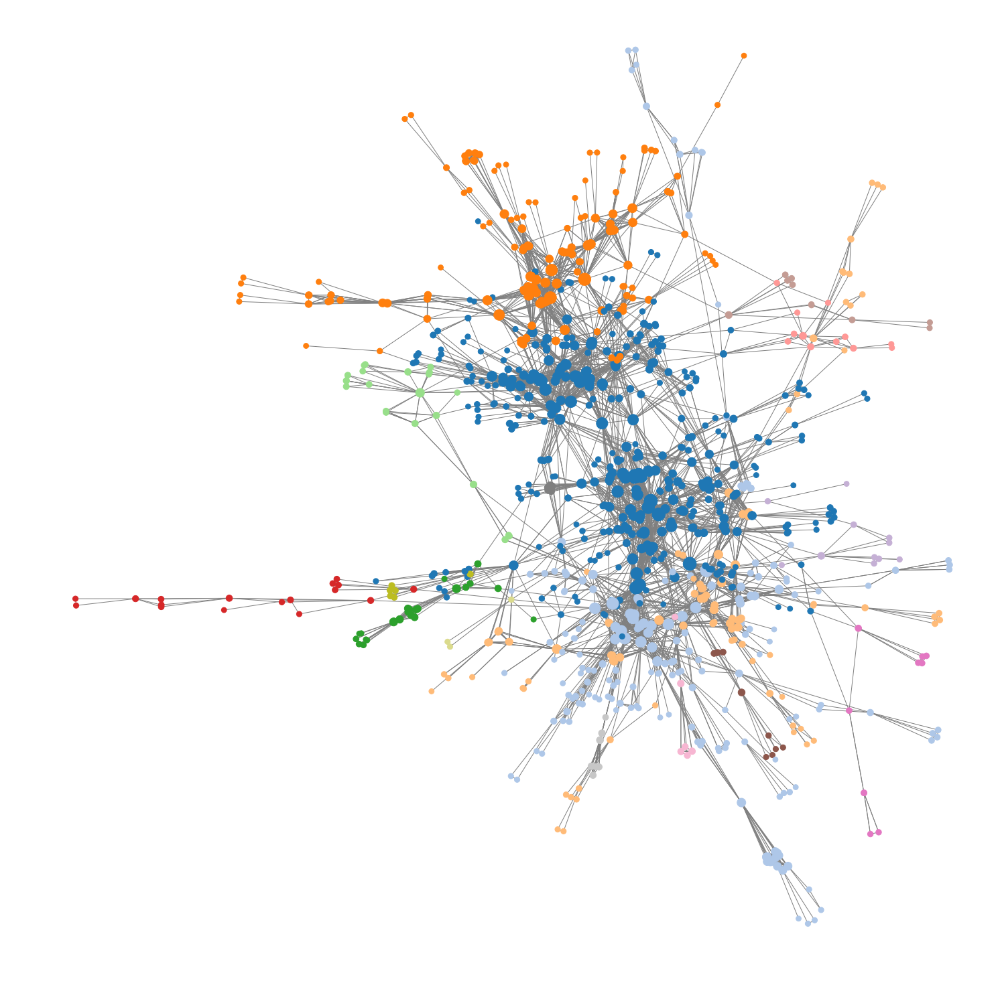

In [93]:
plt.figure(figsize=(20, 20))

nx.draw_spring(main_component, node_color=node_colors, 
                       cmap=ListedColormap(palette.as_hex()),
                       node_size=(node_size+node_size.mean())*6000,
                       #labels=labels,
               edge_color='grey',
               iterations=400
              )

plotting this geographically, we see that there is no clear geographical clustering belonging to these commuitues!

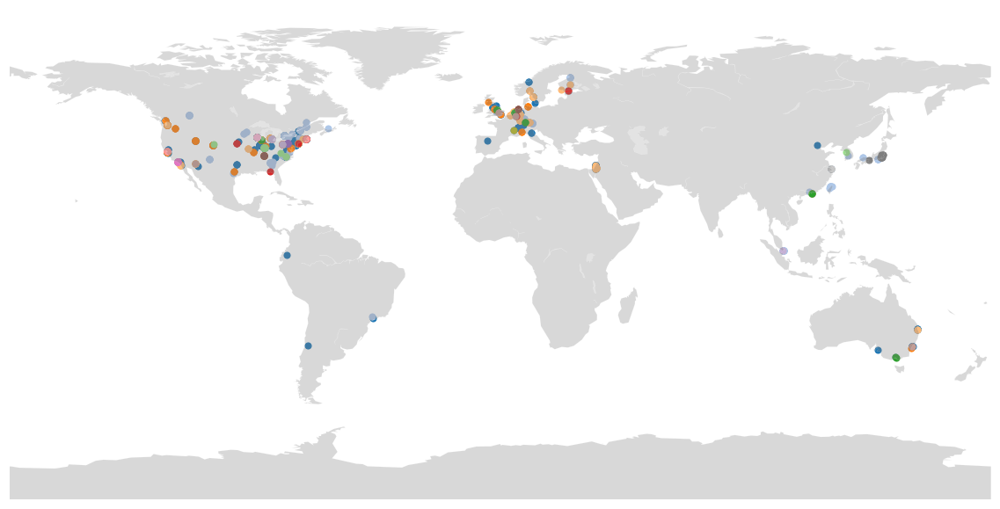

In [94]:
plt.figure(figsize=(20, 20))
m=Basemap()
m.drawmapboundary(linewidth=0)
m.fillcontinents(color='grey', alpha=0.3)
m.drawcoastlines(linewidth=0.1, color="white")
for i,cluster in enumerate(c):
    data = nodes.iloc[list(cluster)].copy()
    m.scatter(data['Lon'], data['Lat'], s= 50, c= palette.as_hex()[i])

Here we have to code that allows to load this graph in Gephi.

As this graph is quite large, we build a smaller graph by cutting off outer nodes, and looking into the connector nodes:

In [95]:
G = nx.k_core(main_component, 12)

In [96]:
node_colors = pd.Series(member_label)[list(G.nodes())].sort_index().tolist()
node_size = np.array(list(nx.betweenness_centrality(G).values()))

In [97]:
people = pd.Series(mapping) 

In [98]:
persons_of_interest = pd.DataFrame(people[list(G.nodes())]).copy()
persons_of_interest['centrality'] = node_size

In [99]:
persons_of_interest.centrality.quantile(.95)

0.06903570513756488

In [100]:
labels = persons_of_interest[persons_of_interest.centrality > persons_of_interest.centrality.quantile(.92)]
labels = labels[0]
labels = labels.to_dict()

/anaconda3/envs/Biblio/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:611: MatplotlibDeprecationWarning: isinstance(..., numbers.Number)
  if cb.is_numlike(alpha):


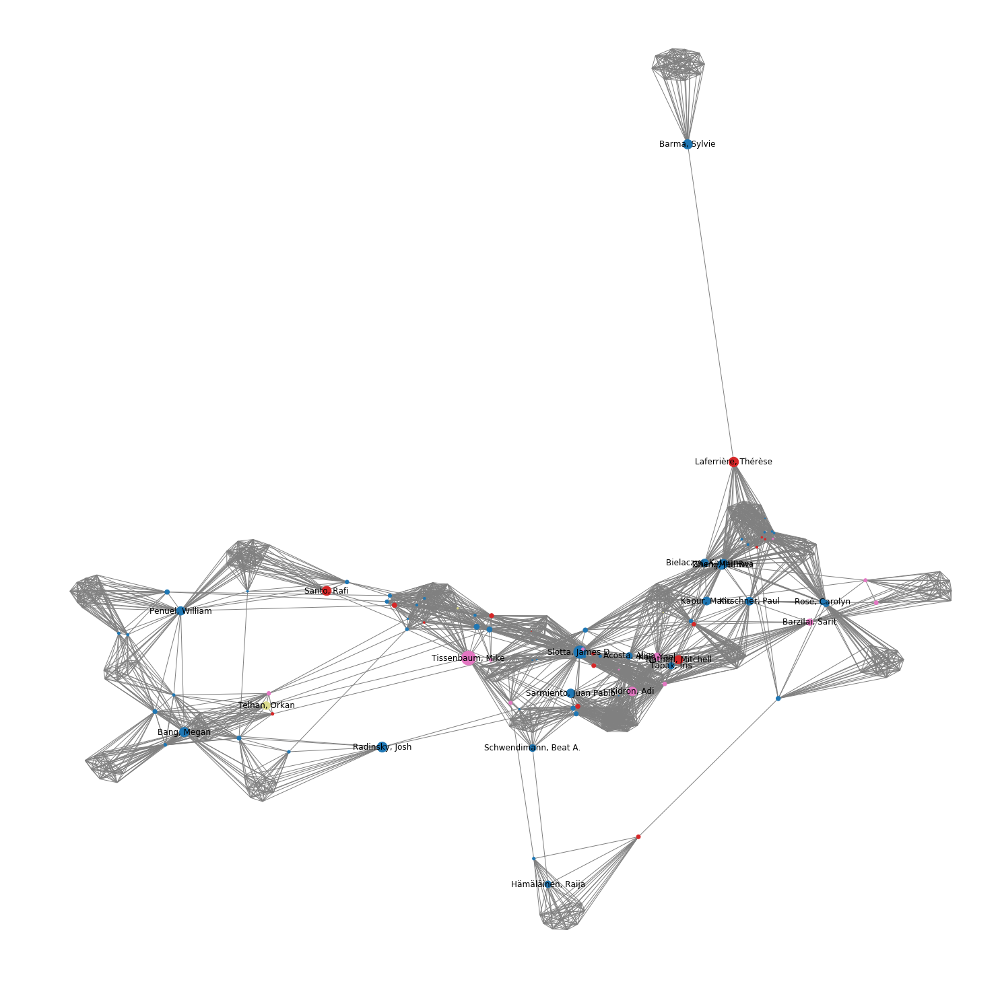

In [101]:
plt.figure(figsize=(20, 20))
nx.draw_spring(G, 
               node_color=node_colors, 
               cmap=ListedColormap(palette.as_hex()),
               node_size=node_size*2000,
                labels=labels,
               edge_color='grey',
               iterations=1000
              )

In [102]:
nx.set_node_attributes(main_component, nodes.country.to_dict(), name='country')
nx.set_node_attributes(main_component, nodes.name.to_dict(), name='uni')
nx.set_node_attributes(main_component, nx.degree_centrality(graph), name='centrality')

#mapping = nodes.long_name.to_dict()
#main_component_names =nx.relabel_nodes(main_component,mapping)
#nx.write_gexf(H, 'data/main_coauthor_graph.gexf')
#nx.write_gpickle(main_component_names, 'data/coauthor_graph')

### Analyzing each subcomponent

We look at distribution of country and inst. inside these clusters (my it's associated members):

In [103]:
c = [x for x in c if len(x) > 20]

Cluster dist for cluster 1


/anaconda3/envs/Biblio/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:611: MatplotlibDeprecationWarning: isinstance(..., numbers.Number)
  if cb.is_numlike(alpha):


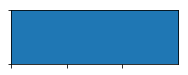

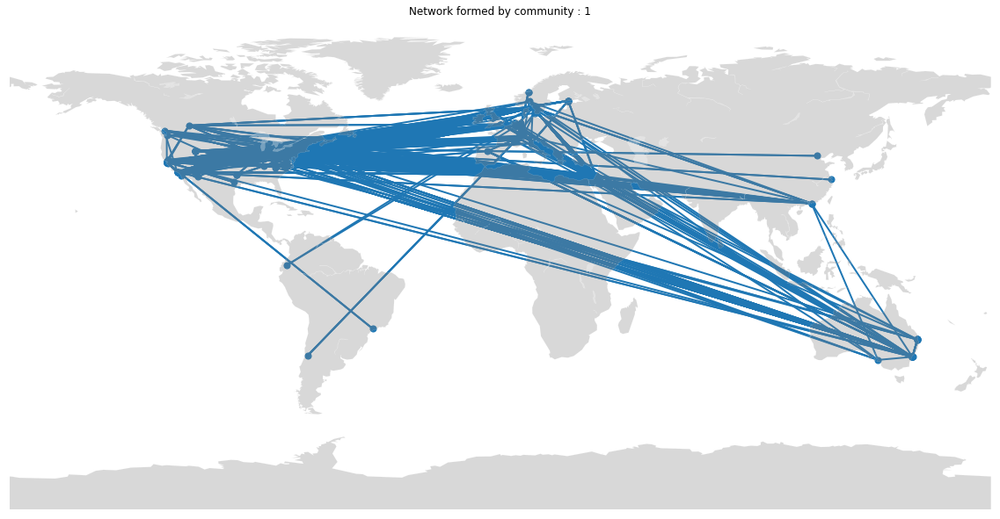

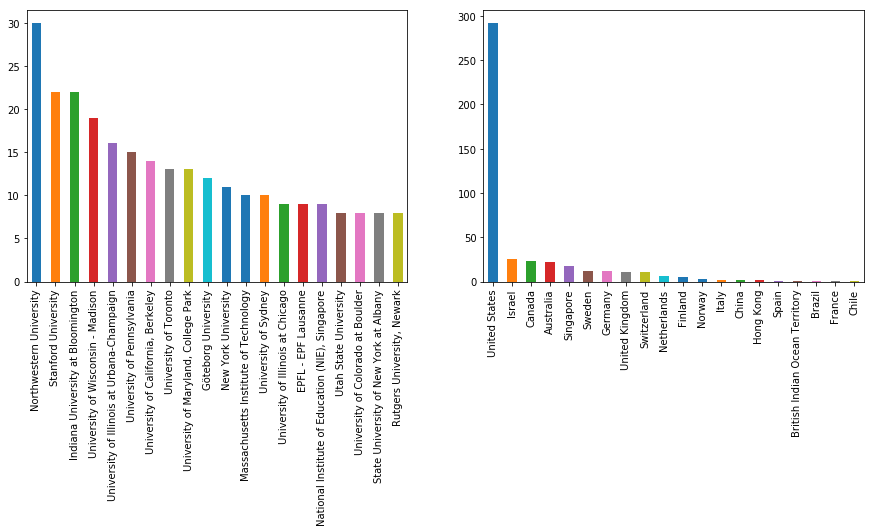

Number of countries in cluster:  22
Number of institutions in cluster:  99
Number of people in cluster:  452


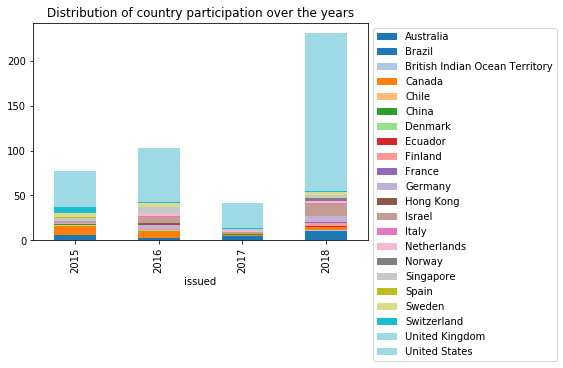

Cluster dist for cluster 2


/anaconda3/envs/Biblio/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:611: MatplotlibDeprecationWarning: isinstance(..., numbers.Number)
  if cb.is_numlike(alpha):


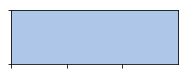

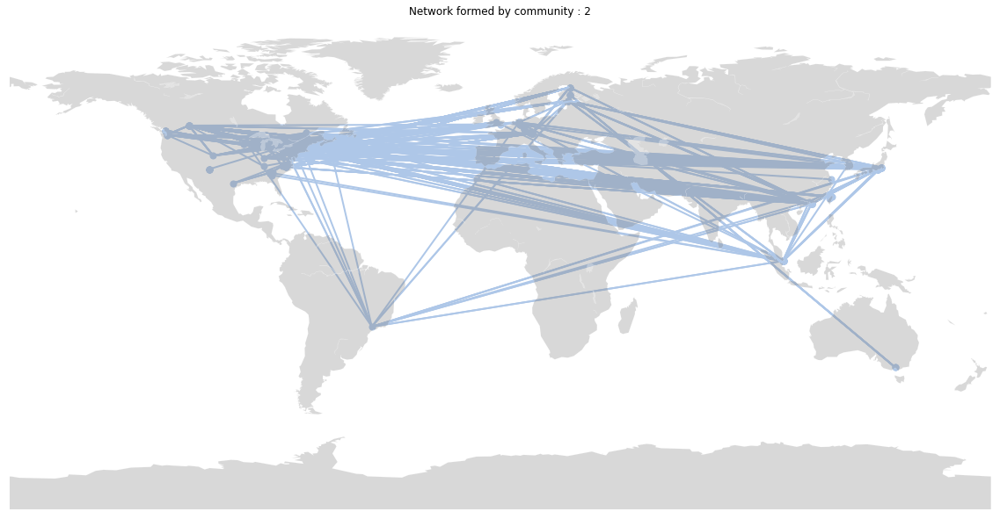

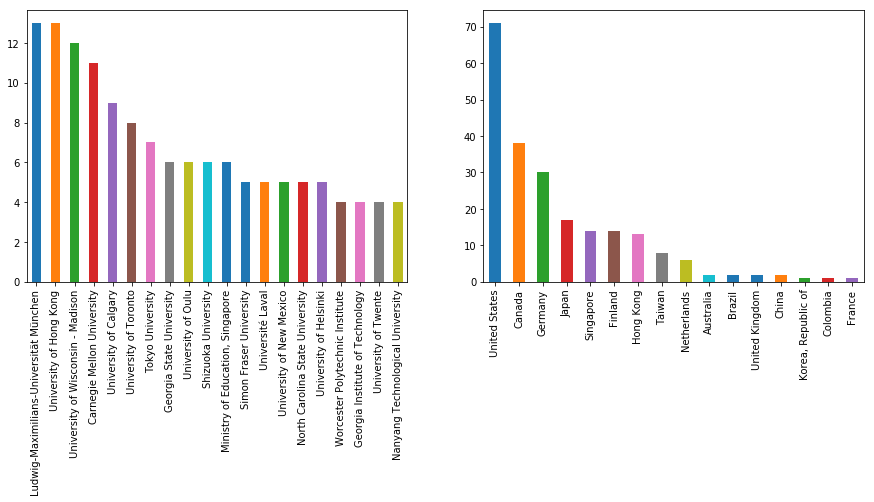

Number of countries in cluster:  16
Number of institutions in cluster:  73
Number of people in cluster:  222


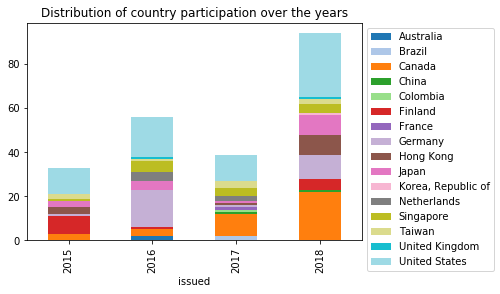

Cluster dist for cluster 3


/anaconda3/envs/Biblio/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:611: MatplotlibDeprecationWarning: isinstance(..., numbers.Number)
  if cb.is_numlike(alpha):


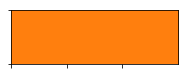

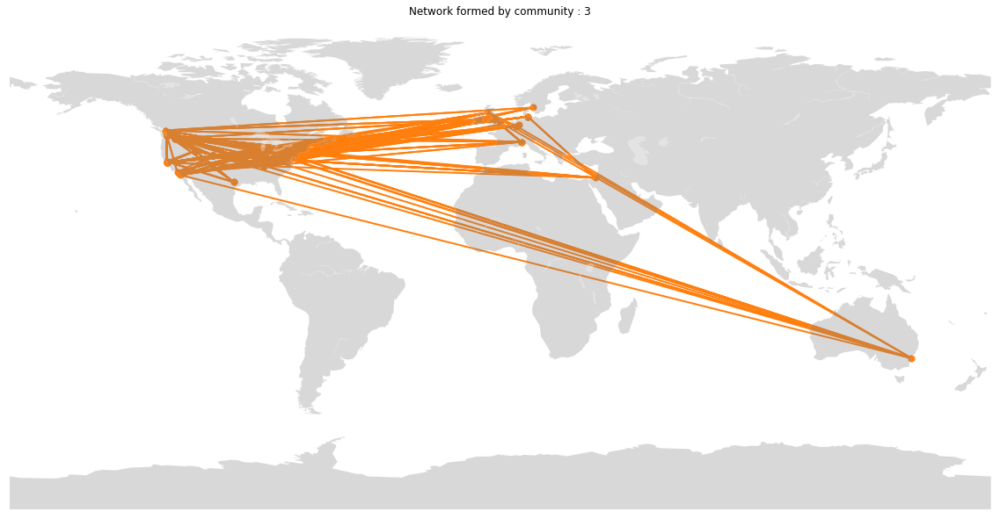

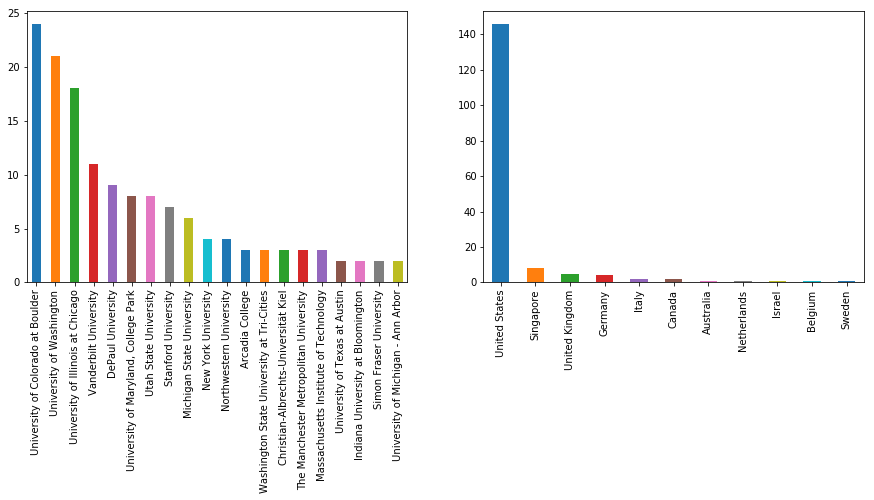

Number of countries in cluster:  11
Number of institutions in cluster:  40
Number of people in cluster:  172


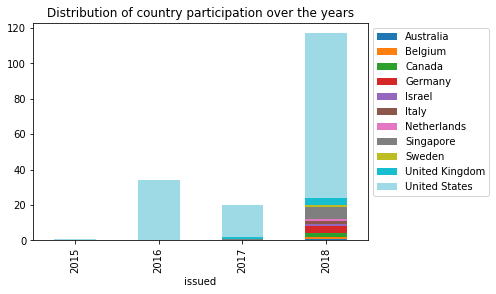

Cluster dist for cluster 4


/anaconda3/envs/Biblio/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:611: MatplotlibDeprecationWarning: isinstance(..., numbers.Number)
  if cb.is_numlike(alpha):


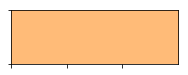

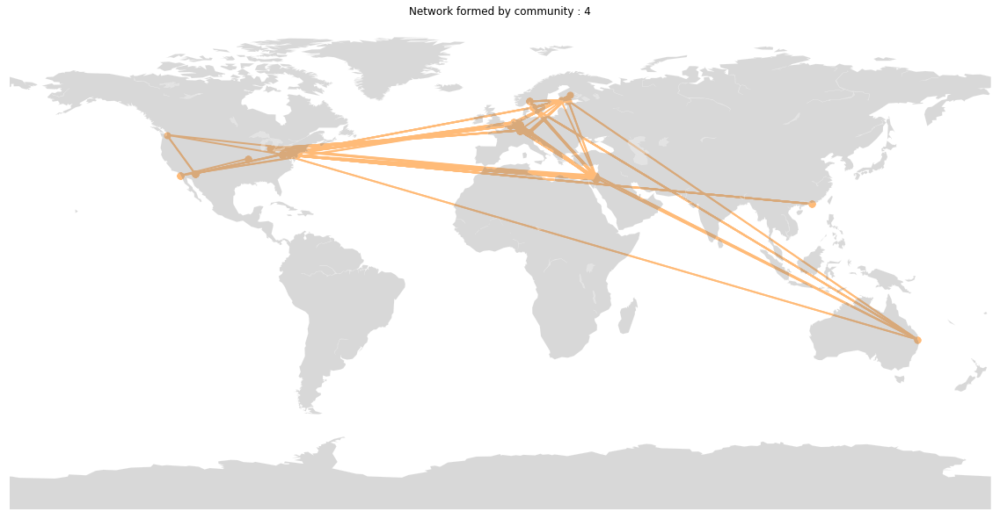

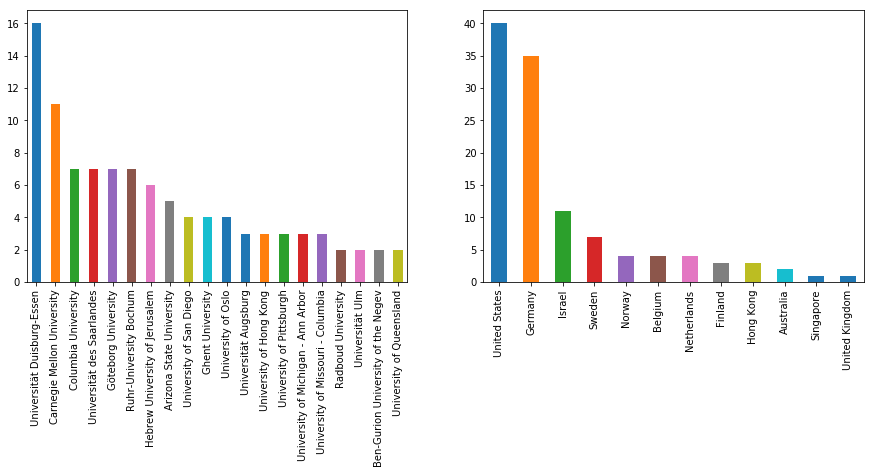

Number of countries in cluster:  12
Number of institutions in cluster:  32
Number of people in cluster:  115


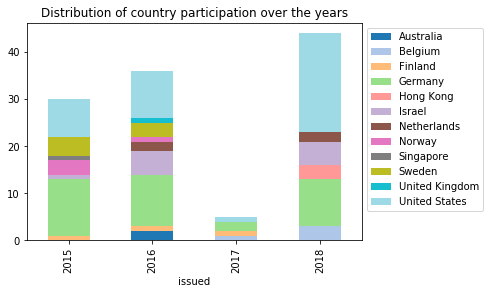

Cluster dist for cluster 5


/anaconda3/envs/Biblio/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:611: MatplotlibDeprecationWarning: isinstance(..., numbers.Number)
  if cb.is_numlike(alpha):


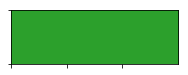

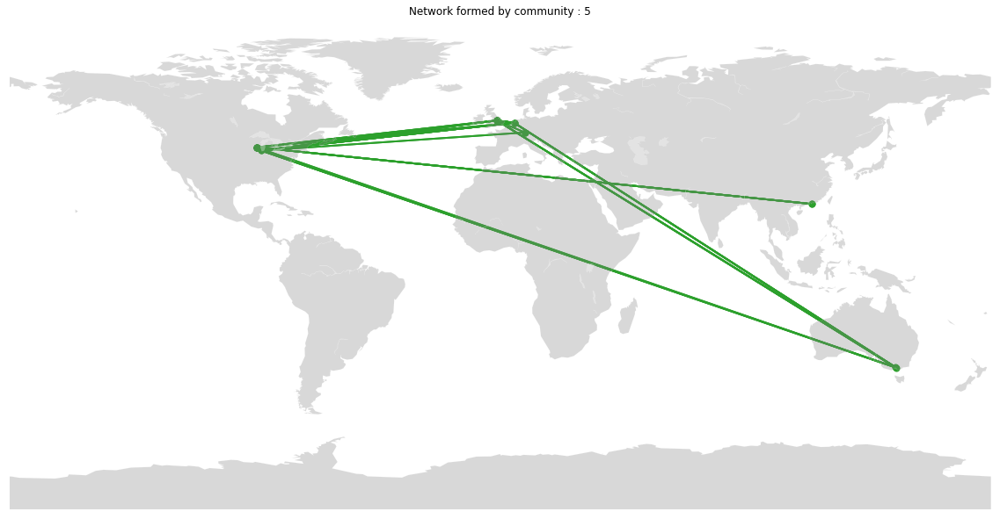

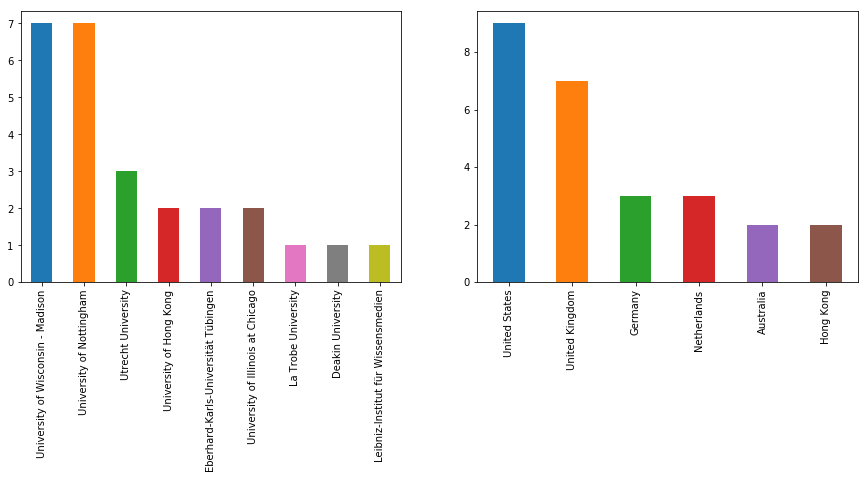

Number of countries in cluster:  6
Number of institutions in cluster:  9
Number of people in cluster:  26


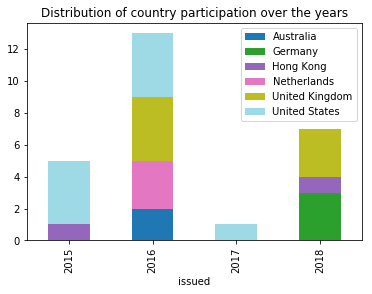

Cluster dist for cluster 6


/anaconda3/envs/Biblio/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:611: MatplotlibDeprecationWarning: isinstance(..., numbers.Number)
  if cb.is_numlike(alpha):


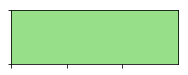

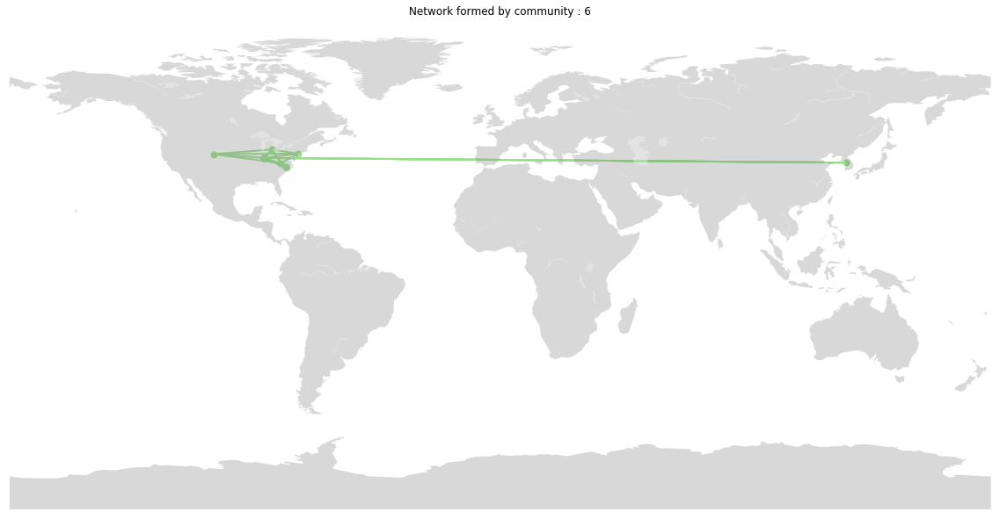

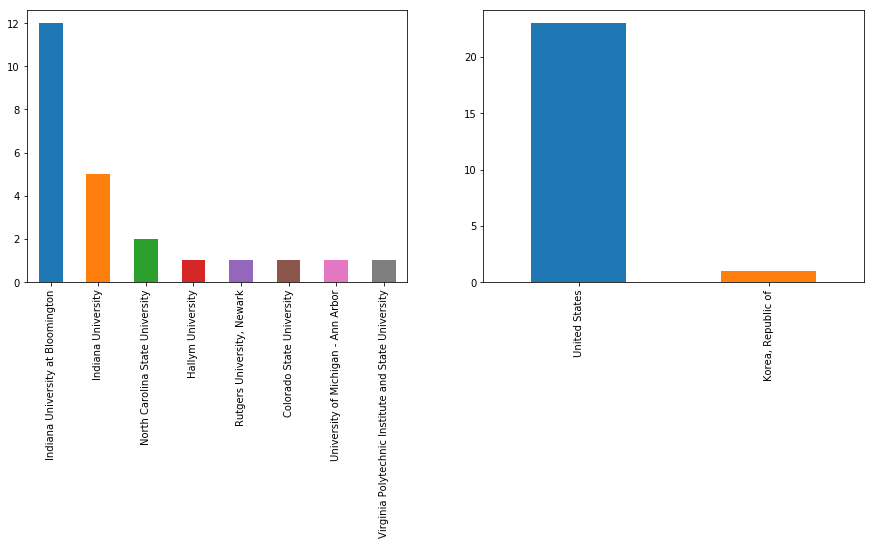

Number of countries in cluster:  2
Number of institutions in cluster:  8
Number of people in cluster:  24


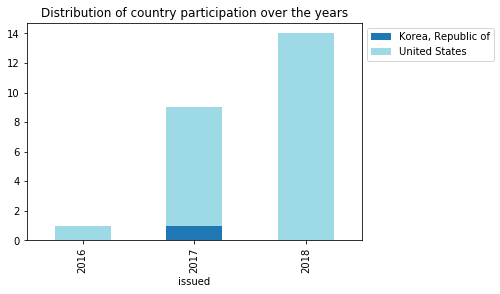

In [104]:
for i,cluster in enumerate(c):
    print(f'Cluster dist for cluster {i+1}')
    sns.palplot(palette[i])
    
    plt.figure(figsize=(20, 20))
    data = nodes.iloc[list(cluster)].copy()
    draw_map_plot(data, palette.as_hex()[i])


    embedding = data.apply(lambda x: [x.Lon, x.Lat], axis=1)
    nx.draw_networkx_edges(main_component.subgraph(cluster),  pos = embedding, 
                           edge_color=palette.as_hex()[i], width = 2)
    
    plt.title('Network formed by community : {}'.format(i+1))
    plt.show()
    
    #adding inner cluster distribution plot
    plt.figure(figsize=(15,5))
    plt.subplot(121)
    nodes.iloc[list(cluster)].name.value_counts().head(20).plot('bar')
    plt.subplot(122)
    nodes.iloc[list(cluster)].country.value_counts().head(20).plot('bar')
    plt.show()
    
    #getting some concrete values
    print('Number of countries in cluster: ', len(nodes.iloc[list(cluster)].country.unique()))
    print('Number of institutions in cluster: ', len(nodes.iloc[list(cluster)].name.unique()))
    print('Number of people in cluster: ', len(nodes.iloc[list(cluster)].long_name.unique()))
    
    #plt.title('Number of people submitting over the years over the years')
    
   
    plot_df = pd.DataFrame(nodes.iloc[list(cluster)].groupby(['issued'])\
                           .country.value_counts()).rename(columns={'country':'count'}).reset_index()
    plot_df.pivot(index='issued', columns='country', values='count').plot(kind='bar', stacked=True, colormap=plt.cm.tab20)
    plt.title('Distribution of country participation over the years')
    plt.legend(bbox_to_anchor=(1, 1))
    
    plt.show()    
    


## An other way to partition the graph: Hierarchical clustering

NOT DONE YET

## Looking at people moving around

We now look at people who moved from one country to an other within the period of the papers in the parsed papers:

We have to look at years as well to avoid duplicates, however, this could be due to people being associated to multiple institutions at once.

In [105]:
name_country = associations[['name', 'mail', 'country', 'long_name', 'shortend_names','issued']]

In [106]:
#Add year to see
df = pd.merge(name_country, name_country, on='long_name').dropna()
df = df[df.country_x != df.country_y]
df['set_countries'] = df.apply(lambda x: ''.join(sorted([x.country_x, x.country_y, str(x.issued_x), str(x.issued_y)])), axis=1)
df[~df[['long_name', 'set_countries']].duplicated()].head()

,name_x,mail_x,country_x,long_name,shortend_names_x,issued_x,name_y,mail_y,country_y,shortend_names_y,issued_y,set_countries
609,University of Toronto,jim.slotta@utoronto.ca,Canada,"Slotta, James D.",Slotta J. D.,2015,Boston College,slotta@bc.edu,United States,Moher T.,2017,20152017CanadaUnited States
619,University of Toronto,jim.slotta@utoronto.ca,Canada,"Slotta, James D.",Kali Y.,2016,Boston College,slotta@bc.edu,United States,Moher T.,2017,20162017CanadaUnited States
707,University of Toronto,alisa.acosta@utoronto.ca,Canada,"Acosta, Alisa",Slotta J. D.,2015,New York University,th1425@nyu.edu,United States,Clark,2018,20152018CanadaUnited States
713,University of Toronto,alisa.acosta@utoronto.ca,Canada,"Acosta, Alisa",Charles E. S.,2016,New York University,th1425@nyu.edu,United States,Clark,2018,20162018CanadaUnited States
719,University of Toronto,alisa.acosta@utoronto.ca,Canada,"Acosta, Alisa",Acosta A.,2018,New York University,th1425@nyu.edu,United States,Clark,2018,20182018CanadaUnited States


In [107]:
df = pd.merge(name_country, name_country, on='long_name').dropna()
df['set_countries'] = df.apply(lambda x: ''.join(sorted([x.name_x, x.name_y, str(x.issued_x), str(x.issued_y)])), axis=1)
df = df[~df[['long_name', 'set_countries']].duplicated()]
df[(df.name_x != df.name_y) & (df.country_x != df.country_y)][['long_name','shortend_names_y', 'name_x', 'name_y', 'issued_x', 'issued_y']].head(3)

,long_name,shortend_names_y,name_x,name_y,issued_x,issued_y
609,"Slotta, James D.",Moher T.,University of Toronto,Boston College,2015,2017
619,"Slotta, James D.",Moher T.,University of Toronto,Boston College,2016,2017
639,"Slotta, James D.",Moher T.,"Ontario Institute for Studies in Education, Un...",Boston College,2016,2017


Number of people that changed organisation:

#TODO fix years

In [108]:
df[(df.name_x != df.name_y) & (df.country_x == df.country_y)].drop_duplicates().head()

,name_x,mail_x,country_x,long_name,shortend_names_x,issued_x,name_y,mail_y,country_y,shortend_names_y,issued_y,set_countries
100,Indiana University at Bloomington,agomoll90@gmail.com,United States,"Gomoll, Andrea Sarah",Gomoll A. S.,2018,Indiana University,agomoll@iu.edu,United States,Gomoll A. S.,2018,20182018Indiana UniversityIndiana University a...
104,Indiana University at Bloomington,agomoll@indiana.edu,United States,"Gomoll, Andrea Sarah",Gomoll A. S.,2016,Indiana University,agomoll@iu.edu,United States,Gomoll A. S.,2018,20162018Indiana UniversityIndiana University a...
243,Georgia State University,lmargulieux@gsu.edu,United States,"Margulieux, Lauren E.",Margulieux L. E.,2018,Georgia Institute of Technology,l.marg@gatech.edu,United States,Margulieux L. E.,2015,20152018Georgia Institute of TechnologyGeorgia...
245,Georgia State University,lmargulieux@gsu.edu,United States,"Margulieux, Lauren E.",Margulieux L. E.,2018,Georgia Institute of Technology,l.marg@gatech.edu,United States,Margulieux L. E.,2016,20162018Georgia Institute of TechnologyGeorgia...
285,Universität Augsburg,ingo.kollar@phil.uni-augsburg.de,Germany,"Kollar, Ingo",Kollar I.,2016,Ludwig-Maximilians-Universität München,ingo.kollar@psy.lmu.de,Germany,Kollar I.,2015,20152016Ludwig-Maximilians-Universität München...


## Looking at the network over the years

One interessting observation is that the ICLS years are much more dense and connected.

In [109]:
associations.issued.unique()

array([2018, 2016, 2015, 2017])

/anaconda3/envs/Biblio/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:611: MatplotlibDeprecationWarning: isinstance(..., numbers.Number)
  if cb.is_numlike(alpha):


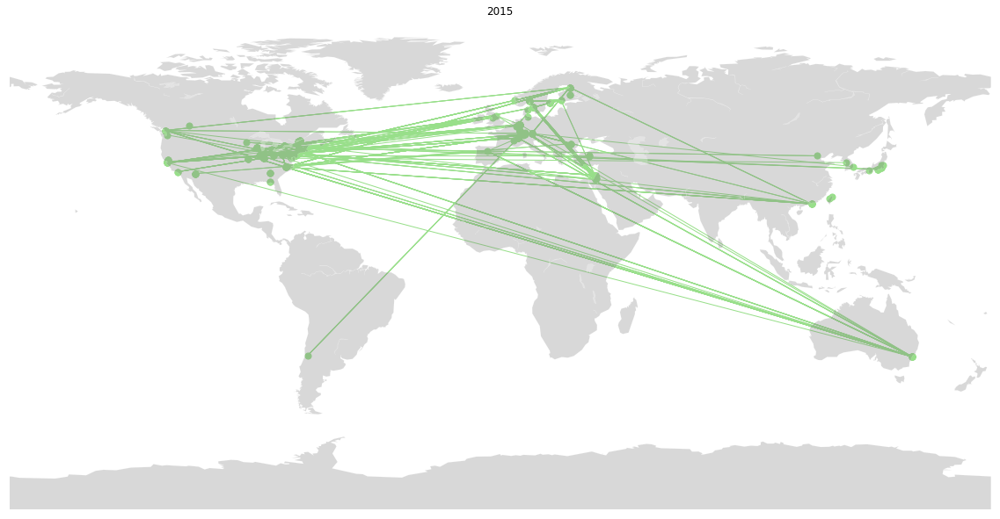

Density of the graph :  0.02257004927089036
The largest component has  58 nodes accounting for 20.42 % of the nodes
The diameter of the largest component is 6
Attribute Assortativity coef: Country:  0.4872566111993374
Attribute Assortativity coef: Uni:  0.35192279075432975


/anaconda3/envs/Biblio/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:611: MatplotlibDeprecationWarning: isinstance(..., numbers.Number)
  if cb.is_numlike(alpha):


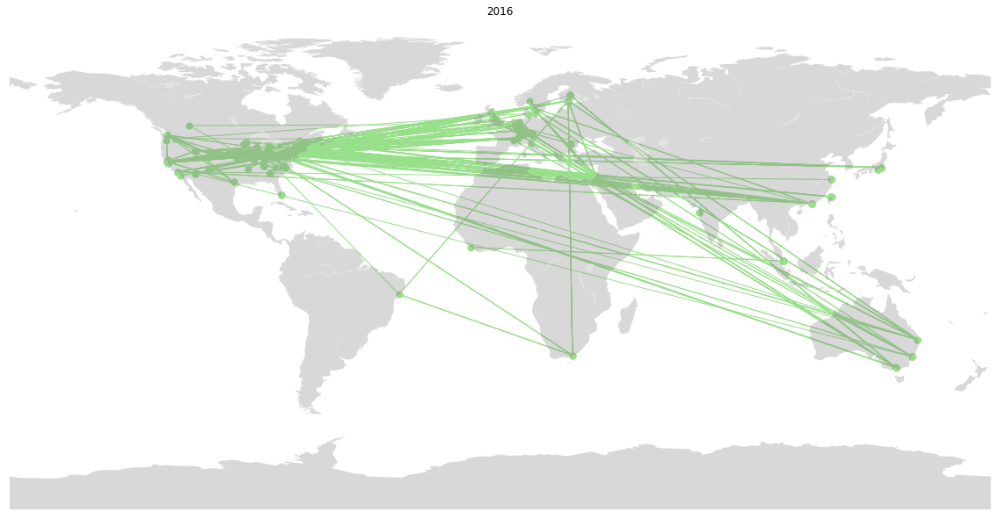

Density of the graph :  0.011657958982433539
The largest component has  105 nodes accounting for 20.92 % of the nodes
The diameter of the largest component is 7
Attribute Assortativity coef: Country:  0.46519228641570703
Attribute Assortativity coef: Uni:  0.3833474734949293


/anaconda3/envs/Biblio/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:611: MatplotlibDeprecationWarning: isinstance(..., numbers.Number)
  if cb.is_numlike(alpha):


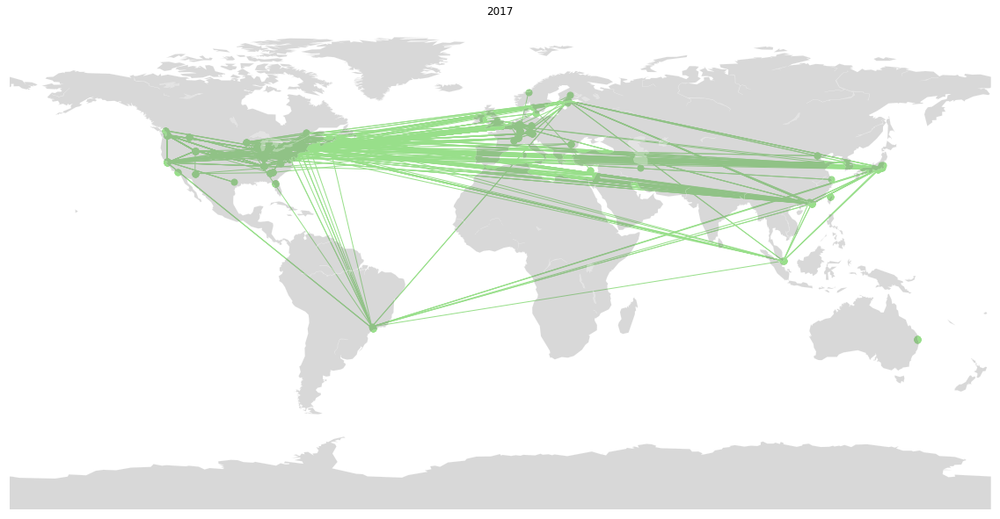

Density of the graph :  0.01702127659574468
The largest component has  73 nodes accounting for 19.41 % of the nodes
The diameter of the largest component is 6
Attribute Assortativity coef: Country:  0.38527048669895203
Attribute Assortativity coef: Uni:  0.2765263915195177


/anaconda3/envs/Biblio/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:611: MatplotlibDeprecationWarning: isinstance(..., numbers.Number)
  if cb.is_numlike(alpha):


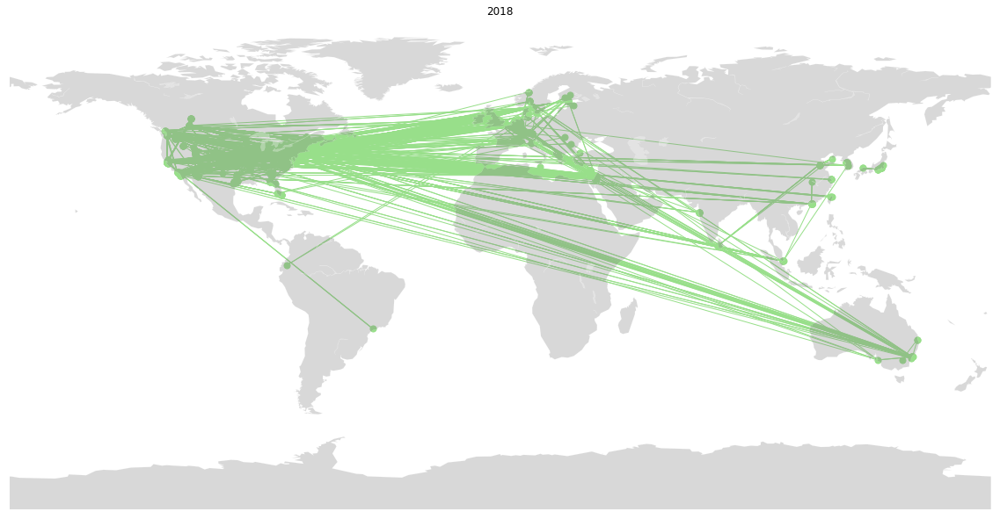

Density of the graph :  0.005508196304229258
The largest component has  411 nodes accounting for 36.63 % of the nodes
The diameter of the largest component is 12
Attribute Assortativity coef: Country:  0.44628840243700113
Attribute Assortativity coef: Uni:  0.32762263808761016


In [110]:
for year in sorted(associations.issued.unique()):

    
    #getting the data in shape to build the graph
    year_assoc = associations[(associations.country.notna()) & (associations.issued==year)]

    self_merge = pd.merge(year_assoc, year_assoc, on='file')
    self_merge = self_merge[self_merge.long_name_x != self_merge.long_name_y]


    nodes = year_assoc[~year_assoc.long_name.duplicated()].reset_index(drop=True).reset_index()
    name_index = nodes.long_name.to_dict()
    name_index = {v: k for k, v in name_index.items()}

    self_merge['source'] = self_merge.long_name_x.map(name_index)
    self_merge['target'] = self_merge.long_name_y.map(name_index)

    #building the graph
    adjacency = get_adjacency(nodes, self_merge)
    graph = nx.from_numpy_array(adjacency)

    #plot the map
    plt.figure(figsize=(20, 20))
    plt.title(year)
    data = nodes.copy()
    draw_map_plot(data, palette.as_hex()[i])


    #add the graph on top
    embedding = nodes.apply(lambda x: [x.Lon, x.Lat], axis=1)
    nx.draw_networkx_edges(graph,  pos = embedding, 
                           edge_color=palette.as_hex()[i], width = 1)
    plt.show()   
    
    
    #calculate graph theoretical measures
    nx.set_node_attributes(graph, nodes.country.to_dict(), name='country')
    nx.set_node_attributes(graph, nodes.name.to_dict(), name='uni')
    nx.set_node_attributes(graph, nx.degree_centrality(graph), name='centrality')

    print('Density of the graph : ' , nx.density(graph))
    comp = list(nx.connected_components(graph))
    largest_comp = max(comp, key=len)
    percentage_lcc = len(largest_comp)/ graph.number_of_nodes() * 100
    print('The largest component has ',
          len(largest_comp), 'nodes',
          'accounting for %.2f'% percentage_lcc, 
          '% of the nodes')
    lcc = graph.subgraph(largest_comp)
    diameter = nx.diameter(lcc)
    print("The diameter of the largest component is", diameter)
    print('Attribute Assortativity coef: Country: ', nx.attribute_assortativity_coefficient(graph, 'country'))
    print('Attribute Assortativity coef: Uni: ', nx.attribute_assortativity_coefficient(graph, 'uni'))
    

From the above we can deduce that:
1. the community is becomming less tight knit by the year (Density of graph, Diameter, Largest component)
2. something weird is going on in 2017, why is largest commponent so smal
3. There seems to be no string geographical linkage (country/uni) for collaboration (Attribute Assorativity Coefficient), which gives us how likely two nodes are linked given that they have the same attribute (country/uni)

## ICLS vs CSCL:

In [111]:
(associations.issued % 2 == 1).sum()

1088

/anaconda3/envs/Biblio/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:611: MatplotlibDeprecationWarning: isinstance(..., numbers.Number)
  if cb.is_numlike(alpha):


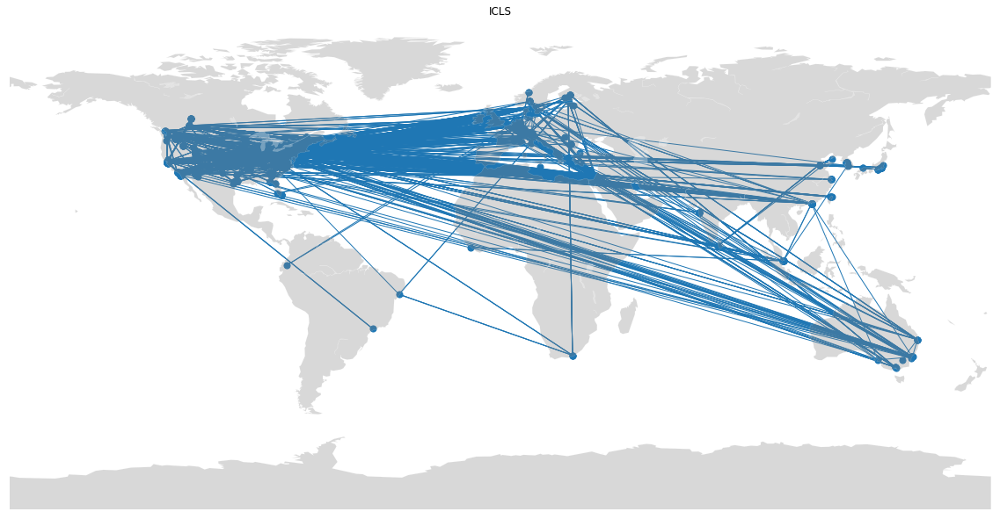

Density of the graph :  0.004721380788560635
The largest component has  800 nodes accounting for 55.94 % of the nodes
The diameter of the largest component is 14
Attribute Assortativity coef: Country:  0.4410538262139251
Attribute Assortativity coef: Uni:  0.33502865975748247


/anaconda3/envs/Biblio/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:611: MatplotlibDeprecationWarning: isinstance(..., numbers.Number)
  if cb.is_numlike(alpha):


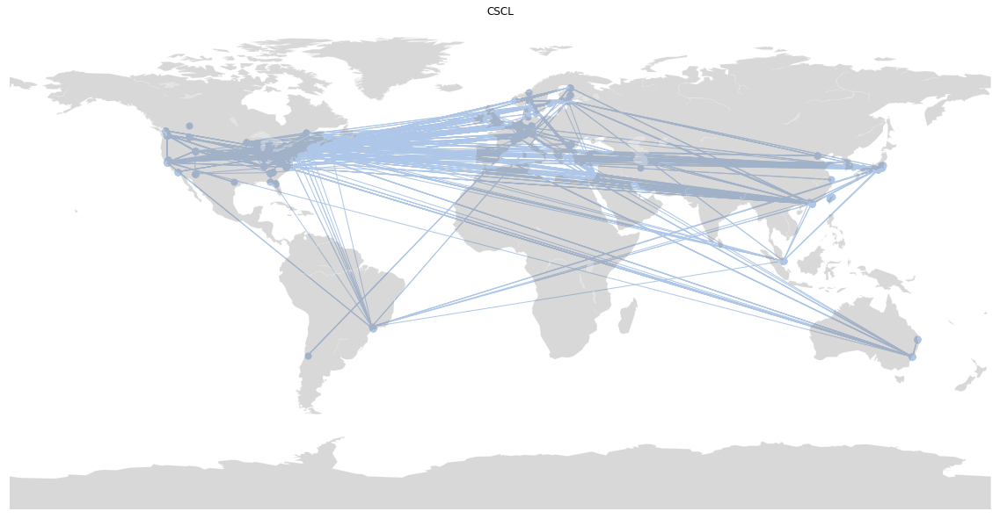

Density of the graph :  0.012059910523244505
The largest component has  148 nodes accounting for 25.39 % of the nodes
The diameter of the largest component is 8
Attribute Assortativity coef: Country:  0.43133937501894337
Attribute Assortativity coef: Uni:  0.3045967405388236


In [112]:
for i, title in enumerate(['ICLS', 'CSCL']):

    year_assoc = associations[(associations.issued % 2 == i)]

    self_merge = pd.merge(year_assoc, year_assoc, on='file')
    self_merge = self_merge[self_merge.long_name_x != self_merge.long_name_y]

    #edges = self_merge[['long_name_x', 'long_name_y', 'issued_x']].copy()

    nodes = year_assoc[~year_assoc.long_name.duplicated()].reset_index(drop=True).reset_index()
    name_index = nodes.long_name.to_dict()
    name_index = {v: k for k, v in name_index.items()}

    self_merge['source'] = self_merge.long_name_x.map(name_index)
    self_merge['target'] = self_merge.long_name_y.map(name_index)

    adjacency = get_adjacency(nodes, self_merge)
    graph = nx.from_numpy_array(adjacency)

    plt.figure(figsize=(20, 20))
    plt.title(title)
    data = nodes.copy()
    draw_map_plot(data, palette.as_hex()[i])


    embedding = nodes.apply(lambda x: [x.Lon, x.Lat], axis=1)
    nx.draw_networkx_edges(graph,  pos = embedding, 
                           edge_color=palette.as_hex()[i], width = 1)
    plt.show()   

    nx.set_node_attributes(graph, nodes.country.to_dict(), name='country')
    nx.set_node_attributes(graph, nodes.name.to_dict(), name='uni')
    nx.set_node_attributes(graph, nx.degree_centrality(graph), name='centrality')


    print('Density of the graph : ' , nx.density(graph))
    
    
    comp = list(nx.connected_components(graph))
    largest_comp = max(comp, key=len)
    
    percentage_lcc = len(largest_comp)/ graph.number_of_nodes() * 100
    print('The largest component has ',
          len(largest_comp), 'nodes',
          'accounting for %.2f'% percentage_lcc, 
          '% of the nodes')
    
    lcc_quak = graph.subgraph(largest_comp)
    diameter = nx.diameter(lcc_quak)
    print("The diameter of the largest component is", diameter)
    print('Attribute Assortativity coef: Country: ', nx.attribute_assortativity_coefficient(graph, 'country'))
    print('Attribute Assortativity coef: Uni: ', nx.attribute_assortativity_coefficient(graph, 'uni'))
    



From the path length in the largest component we see that the core-cummunity (as given by collaboration) of CSCL seems to be much more close knit than the icls community. Looking at the previous graphs with separation by years this may partially be due to the many new participants in 2018's icls, but as 2016's icls also has a larger diameter, this might be an underlying pattern that could be confirmed with more data.

## Re-examining 2018: how do nodes join?

In [113]:
previous_participation = set(associations[~associations.issued.isin([2018])].long_name.tolist())

year_assoc = associations[(associations.Lon.notna()) & (associations.issued == 2018)].copy()

year_assoc['prev'] = 0
year_assoc.loc[year_assoc.long_name.isin(previous_participation),'prev'] = 1

self_merge = pd.merge(year_assoc, year_assoc, on='file')
self_merge = self_merge[(self_merge.long_name_x != self_merge.long_name_y)]


nodes = year_assoc[~year_assoc.long_name.duplicated()].reset_index(drop=True).reset_index()
nodes = nodes[nodes.Lon.notna()]

name_index = nodes.long_name.to_dict()
name_index = {v: k for k, v in name_index.items()}



self_merge['source'] = self_merge.long_name_x.map(name_index)
self_merge['target'] = self_merge.long_name_y.map(name_index)


adjacency = get_adjacency(nodes, self_merge)
graph = nx.from_numpy_array(adjacency)

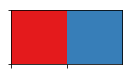

In [114]:
palette = sns.color_palette(palette='Set1', n_colors=2)

sns.palplot(palette)

We see that some of the new nodes joining in 2018 partly attach to people who already have participated in the conference in pervious years, while others join independently.

In red we have ned nodes, blue for old nodes.

/anaconda3/envs/Biblio/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:611: MatplotlibDeprecationWarning: isinstance(..., numbers.Number)
  if cb.is_numlike(alpha):


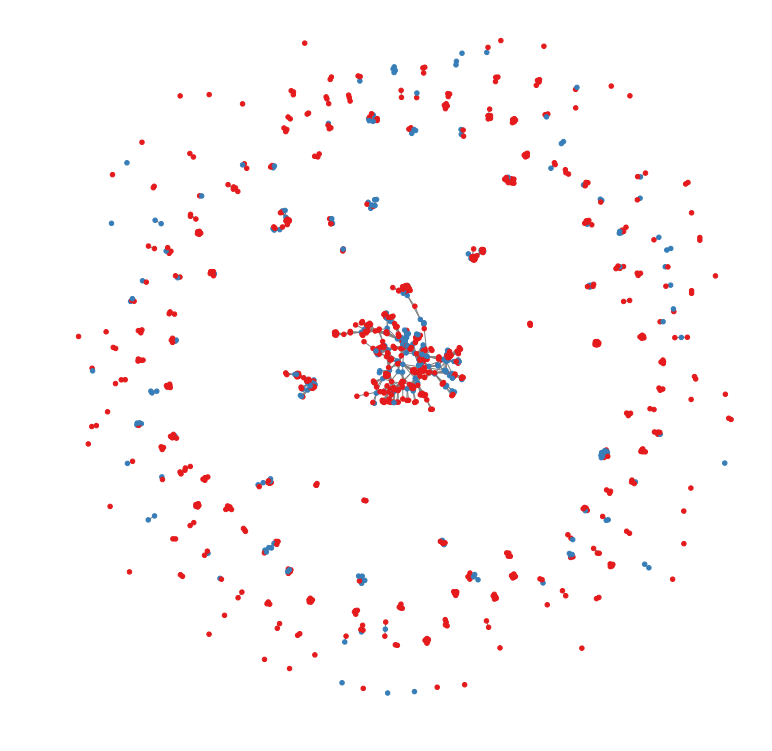

In [115]:
plt.figure(figsize=(10, 10))
nx.draw_spring(graph, cmap=ListedColormap(palette.as_hex()), 
               node_color=nodes.prev.tolist(), width = 1,  edge_color='grey', node_size=[20, 20])

We now analyze these mentors and mentees:

In [116]:
mentoring_connections = self_merge[['long_name_x', 'long_name_y', 'prev_x', 
                                    'prev_y', 'name_x', 'name_y', 'file',
                                   'country_x', 'country_y']]

mentees = mentoring_connections[(mentoring_connections.prev_x != mentoring_connections.prev_y) & 
                      (mentoring_connections.prev_x == 0)]

Number of people that co-authored a paper with somebody who already participated in the conference in previous years:

In [117]:
mentees.long_name_y.drop_duplicates().shape

(226,)

And the institutions they are affiliated with:

In [118]:
mentees[~mentees[['name_y', 'file']].duplicated()].name_y.value_counts().head(10)

Indiana University at Bloomington    14
Stanford University                  13
University of Hong Kong              12
University of Wisconsin - Madison    12
University of Colorado at Boulder    10
Carnegie Mellon University            9
Northwestern University               9
New York University                   8
University of Washington              8
University of Haifa                   7
Name: name_y, dtype: int64

In [119]:
mentees[~mentees[['country_y', 'file']].duplicated()].country_y.value_counts().head(10)

United States     135
Israel             13
Hong Kong          12
Germany            12
Canada              8
Finland             6
United Kingdom      6
Netherlands         5
Japan               5
Australia           5
Name: country_y, dtype: int64

The corresponding mentors:

In [120]:
mentees[~mentees[['long_name_x', 'file']].duplicated()].long_name_x.value_counts().head(10)

Horn, Mike               4
Tu, Xintian              3
Zohar, Asnat R.          3
Walkington, Candace A    3
Thompson, Naomi          3
Moczek, Armin            3
Davis, Bria              3
Penuel, Bill             3
Tolar, Erin              3
Shaw, Mia                3
Name: long_name_x, dtype: int64

Looking at lone wolf participants:

In [121]:
def get_loners(mentoring_connections):
    loner_mask = (mentoring_connections.groupby('file').prev_x.sum() + mentoring_connections.groupby('file').prev_y.sum())
    loner_mask = loner_mask[loner_mask == 0].index.tolist()
    return mentoring_connections[mentoring_connections.file.isin(loner_mask)]

In [122]:
lone_wolfs = get_loners(mentoring_connections)

In [123]:
lone_wolfs.long_name_y.drop_duplicates().shape

(344,)

In [124]:
lone_wolfs[~lone_wolfs[['long_name_x', 'file']].duplicated()].long_name_x.value_counts().head()

Betser, Sagit                     3
Brooks, Christopher               3
Martin, Lee M                     3
Palincsar, Annemarie Palincsar    3
Fitzgerald, Miranda S             3
Name: long_name_x, dtype: int64

Here comes in the increase of americans in 2018!

In [125]:
lone_wolfs[~lone_wolfs[['name_x', 'file']].duplicated()].name_x.value_counts().head()

University of Michigan - Ann Arbor    6
University of Illinois at Chicago     5
University of Colorado at Boulder     5
Vanderbilt University                 4
Arizona State University              3
Name: name_x, dtype: int64

In [126]:
lone_wolfs[~lone_wolfs[['country_x', 'file']].duplicated()].country_x.value_counts().head(10)

United States         92
United Kingdom         4
Germany                4
Korea, Republic of     3
Canada                 2
India                  2
Norway                 2
Cyprus                 2
Australia              2
Denmark                1
Name: country_x, dtype: int64

We should also consider the number of papers, not only the number of participants:

In [127]:
mentees.file.unique().shape

(200,)

In [128]:
lone_wolfs.file.unique().shape

(118,)

In [129]:
mentoring_connections.file.unique().shape

(361,)

The number of papers written uniquely by veterans is then:

In [130]:
mentoring_connections.file.unique().shape[0] - (mentees.file.unique().shape[0]+lone_wolfs.file.unique().shape[0])

43

**We take this idea and apply it to the previous years to get a point of comparisoon:**

#### For 2017

In [131]:
previous_participation = set(associations[~associations.issued.isin([2018, 2017])].long_name.tolist())

year_assoc = associations[(associations.Lon.notna()) & (associations.issued == 2017)].copy()

year_assoc['prev'] = 0
year_assoc.loc[year_assoc.long_name.isin(previous_participation),'prev'] = 1

self_merge = pd.merge(year_assoc, year_assoc, on='file')
self_merge = self_merge[(self_merge.long_name_x != self_merge.long_name_y)]

In [132]:
mentoring_connections = self_merge[['long_name_x', 'long_name_y', 'prev_x', 
                                    'prev_y', 'name_x', 'name_y', 'file',
                                   'country_x', 'country_y']]

mentees = mentoring_connections[(mentoring_connections.prev_x != mentoring_connections.prev_y) & 
                      (mentoring_connections.prev_x == 0)]

Number of people that co-authored a paper with somebody who already participated in the conference in previous years:

In [133]:
mentees.long_name_y.drop_duplicates().shape

(97,)

And the institutions they are affiliated with:

In [134]:
mentees[~mentees[['name_y', 'file']].duplicated()].name_y.value_counts().head(10)

Carnegie Mellon University                6
University of Pennsylvania                4
Pennsylvania State University             4
University of Toronto                     4
State University of New York at Albany    4
University of Hong Kong                   3
University of California, Berkeley        3
Utah State University                     3
New York University                       3
University of Wisconsin - Madison         3
Name: name_y, dtype: int64

In [135]:
mentees[~mentees[['country_y', 'file']].duplicated()].country_y.value_counts().head(10)

United States    34
Germany           6
Canada            4
Japan             4
Switzerland       3
Hong Kong         3
Singapore         2
Romania           2
Taiwan            1
Australia         1
Name: country_y, dtype: int64

We see that in 2017, the number of new participants is much more consistend with numbers of incomming phd et. comming into the field.

Again, looking at lone wolf participants:

In [136]:
lone_wolfs = lone_wolfs = get_loners(mentoring_connections)
lone_wolfs.long_name_y.drop_duplicates().shape

(121,)

We also see much fewer lone wolf participants:

In [137]:
lone_wolfs[~lone_wolfs[['name_x', 'file']].duplicated()].name_x.value_counts().head()

University College London, University of London    3
University of Wisconsin - Madison                  3
University of Washington                           3
George Mason University                            3
University of Florida                              2
Name: name_x, dtype: int64

In [138]:
lone_wolfs[~lone_wolfs[['country_x', 'file']].duplicated()].country_x.value_counts().head(10)

United States     30
United Kingdom     4
Canada             3
Sweden             2
Israel             1
Ireland            1
Cyprus             1
Brazil             1
China              1
Germany            1
Name: country_x, dtype: int64

We should also consider the number of papers, not only the number of participants:

In [139]:
mentees.file.unique().shape

(48,)

In [140]:
lone_wolfs.file.unique().shape

(36,)

In [141]:
mentoring_connections.file.unique().shape

(101,)

The number of papers written uniquely by veterans is then:

In [142]:
mentoring_connections.file.unique().shape[0] - (mentees.file.unique().shape[0]+lone_wolfs.file.unique().shape[0])

17

#### For 2016

In [143]:
previous_participation = set(associations[~associations.issued.isin([2018, 2017, 2016])].long_name.tolist())

year_assoc = associations[(associations.Lon.notna()) & (associations.issued == 2016)].copy()

year_assoc['prev'] = 0
year_assoc.loc[year_assoc.long_name.isin(previous_participation),'prev'] = 1

self_merge = pd.merge(year_assoc, year_assoc, on='file')
self_merge = self_merge[(self_merge.long_name_x != self_merge.long_name_y)]

In [144]:
mentoring_connections = self_merge[['long_name_x', 'long_name_y', 'prev_x', 
                                    'prev_y', 'name_x', 'name_y', 'file',
                                   'country_x', 'country_y']]

mentees = mentoring_connections[(mentoring_connections.prev_x != mentoring_connections.prev_y) & 
                      (mentoring_connections.prev_x == 0)]

Number of people that co-authored a paper with somebody who already participated in the conference in previous years:

In [145]:
mentees.long_name_y.drop_duplicates().shape

(75,)

And the institutions they are affiliated with:

In [146]:
mentees[~mentees[['name_y', 'file']].duplicated()].name_y.value_counts().head(10)

Ludwig-Maximilians-Universität München    6
University of California, Berkeley        5
EPFL - EPF Lausanne                       4
University of Wisconsin - Madison         4
Indiana University at Bloomington         3
Ruhr-University Bochum                    3
Universität Augsburg                      3
Carnegie Mellon University                2
University of Toronto                     2
University of Minnesota - Twin Cities     2
Name: name_y, dtype: int64

In [147]:
mentees[~mentees[['country_y', 'file']].duplicated()].country_y.value_counts().head(10)

United States    26
Germany          10
Canada            4
Switzerland       4
Australia         2
Sweden            2
Israel            2
Hong Kong         2
Taiwan            1
Singapore         1
Name: country_y, dtype: int64

We see that in 2017, the number of new participants is much more consistend with numbers of incomming phd et. comming into the field.

Again, looking at lone wolf participants:

In [148]:
lone_wolfs = get_loners(mentoring_connections)
lone_wolfs.long_name_y.drop_duplicates().shape

(234,)

We also see much fewer lone wolf participants:

In [149]:
lone_wolfs[~lone_wolfs[['name_x', 'file']].duplicated()].name_x.value_counts().head()

Columbia University                   6
University of Colorado at Boulder     6
University of California, Berkeley    4
University of Washington              3
East China Normal University          3
Name: name_x, dtype: int64

In [150]:
lone_wolfs[~lone_wolfs[['country_x', 'file']].duplicated()].country_x.value_counts().head(10)

United States     55
United Kingdom     6
Netherlands        4
Israel             4
Germany            4
Canada             3
China              3
Finland            3
Singapore          2
Australia          2
Name: country_x, dtype: int64

We should also consider the number of papers, not only the number of participants:

In [151]:
mentees.file.unique().shape

(45,)

In [152]:
lone_wolfs.file.unique().shape

(75,)

In [153]:
mentoring_connections.file.unique().shape

(130,)

The number of papers written uniquely by veterans is then:

In [154]:
mentoring_connections.file.unique().shape[0] - (mentees.file.unique().shape[0]+lone_wolfs.file.unique().shape[0])

10